<center>
    <h1 style="color:green;">Data Preprocessing</h1>
    <h2 style="color:green;">Project: Tour Price Prediction</h2>
</center>

<h3> Group : 1 (AMS-B)</h3>
<h3> Members: </h3><br>
1. Rith Chanthyda , ID: e20200612<br>
2. Phun Sreypich  , ID: e20200179<br>
3. Phai Ratha  , ID: e20200190<br>
4. Kry Senghort  , ID: e20200706<br>
5. Mengheab Vathanak  , ID: e20201145<br>
6. Rithy Vira  , ID: e20200978<br>

# 1.Library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.neighbors import NearestNeighbors

#  2.Overview of Data

<h1 style="color:green;">2.1. Data Loading</h1>

In [2]:
# Load CSV file into a pandas dataframe
df1 = pd.read_csv('tour_data.csv')
df1

FileNotFoundError: [Errno 2] No such file or directory: 'tour_data.csv'

<h1 style="color:green;">2.2. Overview of Data</h1>

In [ ]:
def overview(df):
    """Return a Pandas dataframe describing the contents of a source dataframe including missing values."""

    variables = []
    dtypes = []
    count = []
    unique = []

    for item in df.columns:
        variables.append(item)
        dtypes.append(df[item].dtype)
        count.append(len(df[item]))
        unique.append(len(df[item].unique()))

    output = pd.DataFrame({
        'variable': variables,
        'dtype': dtypes,
        'count': count,
        'unique': unique
    })

    return output

In [ ]:
overview(df1)

,variable,dtype,count,unique
0,Index,int64,4785,4785
1,Tour_Name,object,4785,2593
2,Tour_Type,object,4785,88
3,Number_of_Reviewer,float64,4785,132
4,Rating,float64,4785,10
5,Duration,int64,4785,42
6,Price,float64,4785,926
7,Highlight,object,4785,2802
8,Location,object,4785,63


# 3. Data Cleaning

<h1 style="color:green;">3.1. Identify Missing Value </h1>

In [ ]:
def show_missing(df):
    """Return a Pandas dataframe describing the contents of a source dataframe including missing values."""
    
    variables = []
    missing = []
    pc_missing = []
    
    for item in df.columns:
        variables.append(item)
        missing.append(df[item].isna().sum())
        pc_missing.append(round((df[item].isna().sum() / len(df[item])) * 100, 2))

    output = pd.DataFrame({
        'variable': variables, 
        'missing_value': missing, 
        'pc_missing': pc_missing
    })    
        
    return output

In [ ]:
show_missing(df1)

,variable,missing_value,pc_missing
0,Index,0,0.00
1,Tour_Name,0,0.00
2,Tour_Type,2,0.04
3,Number_of_Reviewer,2690,56.22
4,Rating,2690,56.22
5,Duration,0,0.00
6,Price,433,9.05
7,Highlight,0,0.00
8,Location,30,0.63


<h1 style="color:green;">3.2. Handling Missing Value </h1>

## For Category Variable
Since there is only a small amount of missing value for category type, we decide to drop it.

In [ ]:
df1.dropna(subset=['Tour_Type'], inplace=True)
df1.dropna(subset=['Location'], inplace=True)

## For Numerical Variable

1. Identify Numerical Variable

In [ ]:
numerical_features = df1.select_dtypes(include = ['int64','float64']).columns.values
numerical_features

array(['Index', 'Number_of_Reviewer', 'Rating', 'Duration', 'Price'],
      dtype=object)

2. Declare Instance

In [ ]:
from sklearn.impute import KNNImputer
num_impute = KNNImputer()

In [ ]:
df1[numerical_features].head()

,Index,Number_of_Reviewer,Rating,Duration,Price
0,1,992.0,5.0,1,18.0
1,2,55.0,5.0,3,21.5
2,3,288.0,5.0,10,50.0
3,4,18.0,4.5,5,36.0
4,5,308.0,5.0,5,35.0


3. Fit

In [ ]:
num_impute.fit(df1[numerical_features])

KNNImputer()

4. Transform/Apply - df_data

In [ ]:
df1[numerical_features] = num_impute.transform(df1[numerical_features])

5. Check Missing value

In [ ]:
show_missing(df1)

,variable,missing_value,pc_missing
0,Index,0,0.0
1,Tour_Name,0,0.0
2,Tour_Type,0,0.0
3,Number_of_Reviewer,0,0.0
4,Rating,0,0.0
5,Duration,0,0.0
6,Price,0,0.0
7,Highlight,0,0.0
8,Location,0,0.0


## Check the Effectiveness in the impuation

* Let's check whether the KNN imputer is doing a good job in filling missing value or not.
* We will compare the summarize sattistic of the original data and the impute data

In [ ]:
df2 = pd.read_csv('tour_data_predict.csv')
# Compare the summary statistics before and after imputation
print('Original dataset summary statistics:\n', df2.describe())
print('\nImputed dataset summary statistics:\n', df1.describe())

Original dataset summary statistics:
        Number_of_Reviewer       Rating     Duration        Price
count         3128.000000  3128.000000  3128.000000  3128.000000
mean            10.298465     4.466081    19.701087   139.343322
std             52.746322     0.722256    39.131242   229.395808
min              1.000000     1.000000     1.000000     5.000000
25%              1.400000     3.900000     6.000000    48.887000
50%              2.000000     5.000000     7.000000    77.950000
75%              5.000000     5.000000    11.000000   140.760000
max           1289.000000     5.000000  1182.000000  3665.000000

Imputed dataset summary statistics:
              Index  Number_of_Reviewer       Rating     Duration        Price
count  4753.000000         4753.000000  4753.000000  4753.000000  4753.000000
mean   2402.033242           10.695561     4.582180    20.400799   136.569459
std    1380.021448           48.575617     0.678512    39.161142   229.097174
min       1.000000         

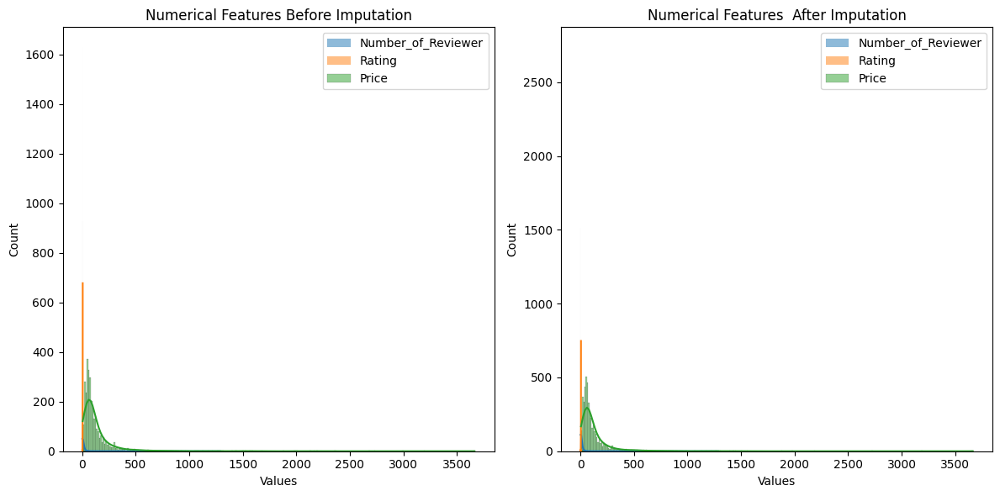

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot histogram of numerical features in the entire dataset before and after imputation
def plot_numerical_histogram(df_before, df_after):
    numerical_cols = df_before.select_dtypes(include='number').columns
    numerical_cols = [col for col in numerical_cols if col not in ['Duration', 'Index']]
    
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    for col in numerical_cols:
        sns.histplot(df_before[col].dropna(), kde=True, label=col)
    plt.title('Numerical Features Before Imputation')
    plt.xlabel('Values')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    for col in numerical_cols:
        sns.histplot(df_after[col].dropna(), kde=True, label=col)
    plt.title('Numerical Features  After Imputation')
    plt.xlabel('Values')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Example usage
plot_numerical_histogram(df2, df1)


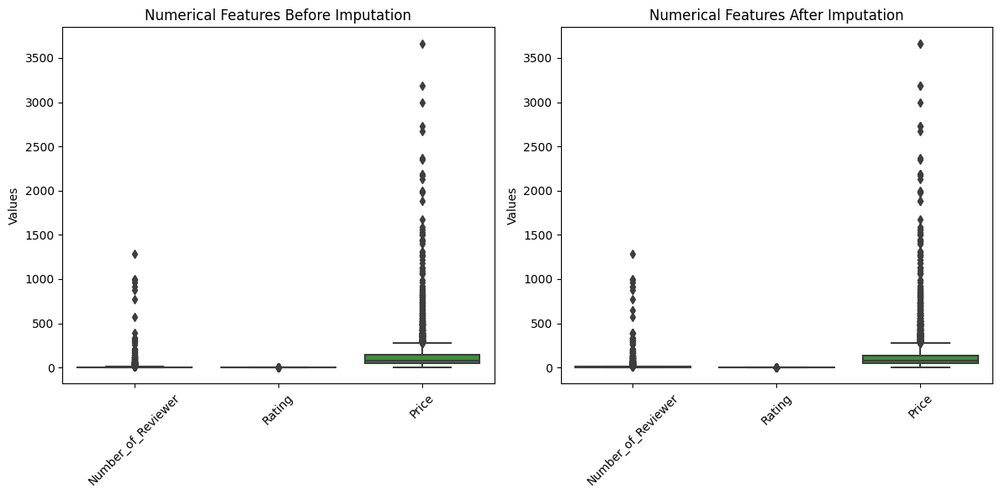

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot boxplot of numerical features in the entire dataset before and after imputation
def plot_numerical_boxplot(df_before, df_after):
    numerical_cols = df_before.select_dtypes(include='number').columns
    numerical_cols = [col for col in numerical_cols if col not in ['Duration', 'Index']]
    
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    boxplot_before = sns.boxplot(data=df_before[numerical_cols].dropna())
    boxplot_before.set_xticklabels(boxplot_before.get_xticklabels(), rotation=45)
    plt.title('Numerical Features Before Imputation')
    plt.ylabel('Values')
    
    plt.subplot(1, 2, 2)
    boxplot_after = sns.boxplot(data=df_after[numerical_cols].dropna())
    boxplot_after.set_xticklabels(boxplot_after.get_xticklabels(), rotation=45)
    plt.title('Numerical Features After Imputation')
    plt.ylabel('Values')

    plt.tight_layout()
    plt.show()

# Example usage
plot_numerical_boxplot(df2, df1)


## Finding:
Base on statistic table, we can conclude that the mean and standard deviation values of the imputed data are not significantly different from the original data. This indicates that our approach to filling the missing values was successful and did not introduce any significant bias to the dataset. We can now confidently use the imputed data for further analysis and modeling.

<h1 style="color:green;">3.3. Handling Duplicate Value </h1>

In [3]:
# select the column for which you want to check the number of duplicates
col_name = ['Tour_Name','Price']

# count the number of duplicate values in the selected column
num_duplicates = df1.duplicated(subset=col_name).sum()

# drop the duplicate rows
df1.drop_duplicates(subset=col_name, inplace=True)

# print the number of duplicate values
print("Number of duplicate values in column {}: {}".format(col_name, num_duplicates))

# confirm the duplicates have been removed
print("Number of remaining rows after dropping duplicates: {}".format(len(df1)))

NameError: name 'df1' is not defined

In [4]:
# select the column for which you want to check the number of duplicates
col_name = ['Tour_Name', 'Price']

# count the number of duplicate values in the selected column
num_duplicates = df1.duplicated(subset=col_name).sum()

# drop the duplicate rows
df1.drop_duplicates(subset=col_name, inplace=True)
df1 = df1.drop('Index', axis=1)

# print the number of duplicate values
print("Number of duplicate values in column {}: {}".format(col_name, num_duplicates))

NameError: name 'df1' is not defined

<h1 style="color:green;">3.4. Final Check on data </h1>

In [5]:
df = pd.read_csv('tour_data_predict.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'tour_data_predict.csv'

In [ ]:
def final_check(df):
    """Return a Pandas dataframe describing the contents of a source dataframe including missing values and duplicates."""
    
    variables = []
    missing = []
    pc_missing = []
    
    for item in df.columns:
        variables.append(item)
        missing.append(df[item].isna().sum())
        pc_missing.append(round((df[item].isna().sum() / len(df[item])) * 100, 2))
        
    output = pd.DataFrame({
        'variable': variables, 
        'missing_value': missing, 
        'pc_missing': pc_missing
    })    
        
    return output


In [6]:
final_check(df)

NameError: name 'final_check' is not defined

In [7]:
# print the number of duplicate values
print("Number of duplicate values in column {}: {}".format(col_name, num_duplicates))


NameError: name 'num_duplicates' is not defined

In [8]:
df

NameError: name 'df' is not defined

<h1 style="color:green;">3.5. Feature Interaction </h1>

**In this part we tranform exiting data into new features**

<b> 1.Create Tour Popularity Column Base on Number of Reviewer </b>

In [9]:
for index, row in df.iterrows():
    if 80 <= row['Number_of_Reviewer'] <= 1289:
        df.at[index, 'Tour_Popularity'] = 'high'
    elif 20 <= row['Number_of_Reviewer'] <= 80:
        df.at[index, 'Tour_Popularity'] = 'meduim'
    elif 1 <= row['Number_of_Reviewer'] <= 20:
        df.at[index, 'Tour_Popularity'] = 'low'
    else:
        df.at[index, 'Tour_Popularity'] = 'high'

NameError: name 'df' is not defined

<b> 2.Create Group Size Column Base on Tour Price and Tour Duration </b>

In [10]:
df['Group_Size'] = ''

for index, row in df.iterrows():
    price = row['Price']
    duration = row['Duration']

    if 100 <= price <= 3665:
        if 10 <= duration <= 500:
            df.at[index, 'Group_Size'] = 'Individual'
        elif 1 <= duration <= 9:
            df.at[index, 'Group_Size'] = 'Group'
        else:
            df.at[index, 'Group_Size'] = 'Individual'
    elif 1 <= price <= 99:
        if 9 <= duration <= 500:
            df.at[index, 'Group_Size'] = 'Individual'
        elif 5 <= duration <= 9:
            df.at[index, 'Group_Size'] = 'Individual'
        elif 1 <= duration <= 4:
            df.at[index, 'Group_Size'] = 'Group'
        else:
            df.at[index, 'Group_Size'] = 'Group'

NameError: name 'df' is not defined

<b> 3. Create Transportation Quality Column Base on Highlight </b>

- pip install -U pip setuptools wheel
- pip install -U spacy
- python -m spacy download en_core_web_sm

In [11]:
import spacy
spacy.prefer_gpu()

# Load the spaCy model
nlp = spacy.load('en_core_web_sm')

# Define the function to determine accommodation quality
def get_transportation_quality(row):
    text = row['Highlight']
    price = row['Price']

    doc = nlp(text.lower())

    excellent_keywords = ['air condition transportation', 'private transportation', 'tour guide', 'hotel pick up', 'professional diver', 'water', 'tower', 'hotel pickup and drop-off', 'accommodation', 'a private english speaking tour guide']
    good_keywords = ['air condition transportation', 'hotel pick up', 'drinking water']

    if any(keyword in doc.text for keyword in excellent_keywords) and (200 <= price <= 3665):
        return 'Ex'
    elif any(keyword in doc.text for keyword in good_keywords) and (60 <= price <= 199):
        return 'Gd'
    elif 1 <= price <= 59:
        return 'Avg'
    else:
        return 'Gd'

# Assuming you have a DataFrame named 'df' with the 'Highlight' and 'Price' columns
df['Transportation_Quality'] = df.apply(get_transportation_quality, axis=1)


c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\cuda\__init__.py:529: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 9010). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\c10\cuda\CUDAFunctions.cpp:109.)
  return torch._C._cuda_getDeviceCount() if nvml_count < 0 else nvml_count


KeyboardInterrupt: 

<b> Create Food Column Base on Hightlight </b>

In [27]:
import pandas as pd
import spacy

# Load the spaCy model with GloVe embeddings
nlp = spacy.load('en_core_web_lg')

# Assuming you have a DataFrame named 'df' with the 'Highlight' column

# Create an empty 'Food' column
df['Food'] = ''

# Define a list of food-related keywords
food_keywords = ['food', 'meal', 'snack', 'breakfast', 'lunch', 'dinner', 'lunchs', 'fruit']

# Convert the 'Highlight' column to lowercase
df['Highlight'] = df['Highlight'].str.lower()

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    highlight = row['Highlight']

    # Process the highlight text with spaCy
    doc = nlp(highlight)

    # Check if any token in the processed text is food-related
    is_food_related = any((token.pos_ == 'NOUN' or token.lemma_.lower() in food_keywords) and token.similarity(nlp('food')) > 0.5 for token in doc)

    # Assign 'Yes' or 'No' based on the food-related check
    df.at[index, 'Food'] = 'Yes' if is_food_related else 'No'

C:\Users\LH\AppData\Local\Temp\ipykernel_17324\457718981.py:26: UserWarning: [W008] Evaluating Token.similarity based on empty vectors.
  is_food_related = any((token.pos_ == 'NOUN' or token.lemma_.lower() in food_keywords) and token.similarity(nlp('food')) > 0.5 for token in doc)


<b> Create Tour Quality Base on existing data </b>

In [28]:
import pandas as pd

# Assuming you have a DataFrame named 'df' with 'Tour Popularity' and 'Accommodation Quality' columns

# Define a function to determine the tour quality based on popularity and accommodation quality
def get_tour_quality(popularity, transportation_quality):
    if popularity == 'high' or transportation_quality == 'Ex':
        return 5
    elif popularity == 'high' or transportation_quality == 'Gd':
        return 4
    elif popularity == 'medium' or transportation_quality == 'Gd':
        return 3
    elif popularity == 'medium' or popularity == 'low':
        return 2
    else:
        return 1

# Apply the function to create the 'Tour Quality' column
df['Tour_Quality'] = df.apply(lambda row: get_tour_quality(row['Tour_Popularity'], row['Transportation_Quality']), axis=1)


In [29]:
df = df.drop('Highlight', axis=1) 

In [30]:
df.to_csv('tranform.csv', index=False)

In [31]:
df= pd.read_csv('tranform.csv')

<h1 style="color:green;">3.6. New Datset </h1>

In [32]:
df

,Tour_Name,Tour_Type,Number_of_Reviewer,Rating,Duration,Price,Location,Tour_Popularity,Group_Size,Transportation_Quality,Food,Tour_Quality
0,Phare: The Cambodian Circus Show in Siem Reap,Sightseeing Tours,992.0,5.0,1.0,18.000,Siem Reap,high,Group,Avg,No,5
1,Khmer Gourmet Cooking Class,Food Tours,55.0,5.0,3.0,21.500,Siem Reap,meduim,Group,Avg,No,1
2,Koh Ker & Beng Mealea Full-Day Join-in Tour,Adventure Tours,288.0,5.0,10.0,50.000,Siem Reap,high,Individual,Avg,No,5
3,"Kampot Day Tour ""Bokor National Park""",Adventure Tours,18.0,4.5,5.0,36.000,Kampot,low,Individual,Avg,No,2
4,Bike the Siem Reap Countryside with Local Expert,Adventure Tours,308.0,5.0,5.0,35.000,Siem Reap,high,Individual,Avg,Yes,5
...,...,...,...,...,...,...,...,...,...,...,...,...
3123,"Phnom Kulen Tour,Waterfalls,1000 Linga River,R...",Bus Tours,7.4,5.0,7.0,75.000,Siem Reap,low,Individual,Gd,No,4
3124,Koh Khe Beng Mealea less crowded Private Tour,Cultural Tours,6.6,4.8,10.0,92.232,Siem Reap,low,Individual,Gd,No,4
3125,Special Angkor Sunrise & Sunset Tour,Sightseeing Tours,7.4,5.0,9.0,61.540,Siem Reap,low,Individual,Gd,No,4
3126,Most Amazing Angkor Tour,Adventure Tours,1.0,5.0,12.0,92.232,Siem Reap,low,Individual,Gd,No,4


In [33]:
missing_values = df.isnull().sum()
missing_values

Tour_Name                 0
Tour_Type                 0
Number_of_Reviewer        0
Rating                    0
Duration                  0
Price                     0
Location                  0
Tour_Popularity           0
Group_Size                2
Transportation_Quality    0
Food                      0
Tour_Quality              0
dtype: int64

In [34]:
df = df.dropna()

In [35]:
missing_values = df.isnull().sum()
missing_values

Tour_Name                 0
Tour_Type                 0
Number_of_Reviewer        0
Rating                    0
Duration                  0
Price                     0
Location                  0
Tour_Popularity           0
Group_Size                0
Transportation_Quality    0
Food                      0
Tour_Quality              0
dtype: int64

# EDA

<h1 style="color:green;">1. Outlier Detected</h1>

In [36]:
import plotly.graph_objs as go

# Select numerical columns from your dataset
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Create a list of box trace objects
box_traces = [go.Box(x=df[var], name=var) for var in numerical_features]

# Set layout for the plot
layout = go.Layout(title='Boxplots of Numerical Features')

# Create a figure object with box traces and layout
fig = go.Figure(data=box_traces, layout=layout)

# Show the plot
fig.show()

Finding:
* Our dataset contains a significant number of outliers, but we have chosen not to remove them as we believe they are inherent to the nature of the data. For example, the **"Price"** feature may have outliers due to the option for group or individual tours. Similarly, the **"Number_of_Reviewers"** feature may vary depending on the popularity of certain locations and preferences of different individuals. Given these considerations, we have made the decision to retain the outliers in our analysis, recognizing that they contribute valuable insights into the diverse aspects of the data.

<h1 style="color:green;">2. Univariate Analysis</h1>

<b> Distribution of Target Variable</b>

C:\Users\LH\AppData\Local\Temp\ipykernel_17324\4023300634.py:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<AxesSubplot: xlabel='Price', ylabel='Density'>

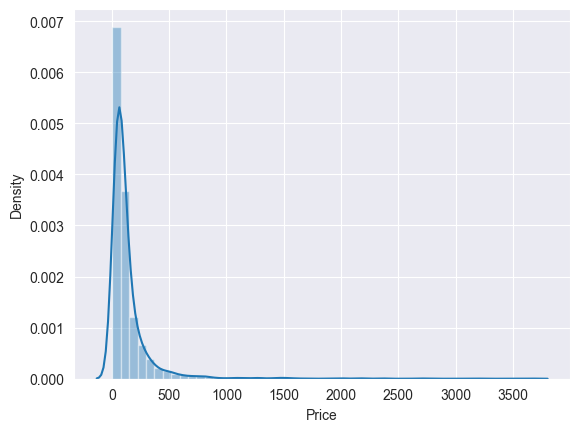

In [37]:
import seaborn as sns
sns.set_style('darkgrid')
sns.distplot(df['Price'])

<b> Distribution of Numerical Features</b>

array([[<AxesSubplot: title={'center': 'Number_of_Reviewer'}>,
        <AxesSubplot: title={'center': 'Rating'}>,
        <AxesSubplot: title={'center': 'Duration'}>],
       [<AxesSubplot: title={'center': 'Price'}>,
        <AxesSubplot: title={'center': 'Tour_Quality'}>, <AxesSubplot: >],
       [<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >],
       [<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >],
       [<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >],
       [<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >],
       [<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >],
       [<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >],
       [<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >]], dtype=object)

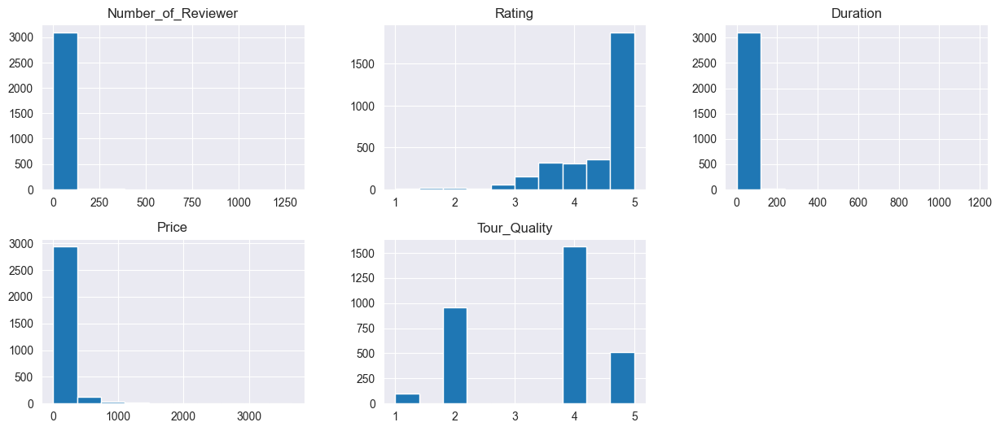

In [38]:
df.hist(figsize=(15,30),layout=(9,3))

<b> Barchart of Category Features</b>

In [39]:
import plotly.graph_objects as go

# Assuming 'df' is your DataFrame and 'category_variables' is a list of categorical variable names
category_variables = ['Tour_Type', 'Location', 'Tour_Popularity', 'Group_Size', 'Transportation_Quality', 'Food']

# Create an empty list to store the bar chart figures
figures = []

# Iterate through each categorical variable
for variable in category_variables:
    # Count the occurrences of each category
    category_counts = df[variable].value_counts()

    # Create the bar chart figure for the current variable
    fig = go.Figure(data=[go.Bar(x=category_counts.index, y=category_counts.values)])

    # Customize the chart layout and size
    fig.update_layout(
        title=f"Bar Chart of {variable}",
        xaxis_title= variable,
        yaxis_title="Count",
        showlegend=False,
        plot_bgcolor='rgb(240,240,240)',
        height=400,  # Adjust the height of the graph
        width=800    # Adjust the width of the graph
    )

    # Add the figure to the list
    figures.append(fig)

# Display all the bar charts
for fig in figures:
    fig.show()



<b> Piechart of Category Features</b>

In [40]:
import plotly.graph_objects as go

# Assuming 'df' is your DataFrame and 'category_variables' is a list of categorical variable names
category_variables = ['Tour_Type', 'Location', 'Tour_Popularity', 'Group_Size', 'Transportation_Quality', 'Food']
# Create an empty list to store the pie chart figures
figures = []

# Iterate through each categorical variable
for variable in category_variables:
    # Count the occurrences of each category
    category_counts = df[variable].value_counts()

    # Create the pie chart figure for the current variable
    fig = go.Figure(data=[go.Pie(labels=category_counts.index, values=category_counts.values)])

    # Customize the chart layout and size
    fig.update_layout(
        title=f"Pie Chart of {variable}",
        showlegend=True,
        plot_bgcolor='rgb(240,240,240)',
        height=400,  # Adjust the height of the graph
        width=800    # Adjust the width of the graph
    )

    # Add the figure to the list
    figures.append(fig)

# Display all the pie charts
for fig in figures:
    fig.show()


<h1 style="color:green;">3. Bivariate Analysis</h1>

## Scatterplot of Numerical Variables with Target Variable

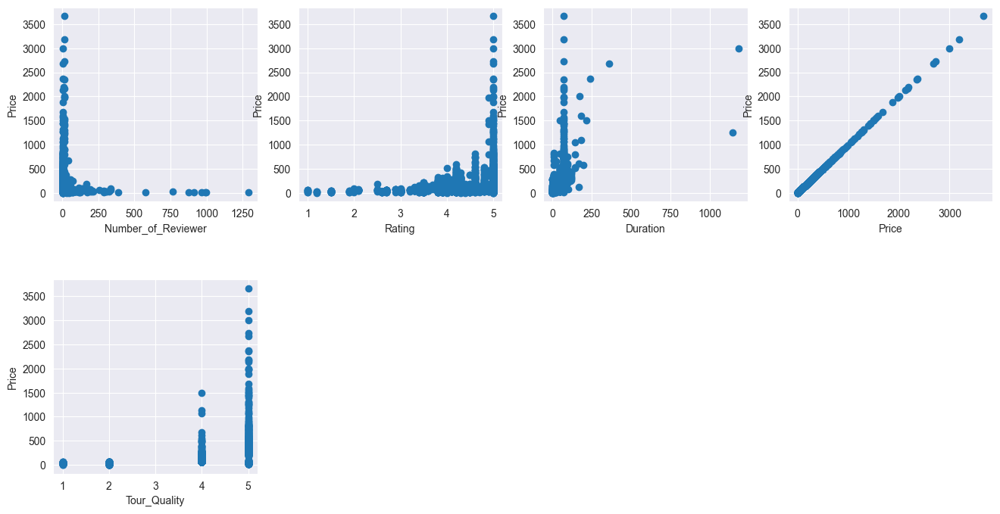

In [41]:
import math
import seaborn as sns
import matplotlib.pyplot as plt

df_num = df.select_dtypes(include=['float64', 'int64'])
num_cols = df_num.columns
num_plots = len(num_cols)
num_rows = math.ceil(num_plots / 4)

plt.figure(figsize=(16, num_rows * 4))
plt.subplots_adjust(hspace=0.4)

for i, col in enumerate(num_cols):
    plt.subplot(num_rows, 4, i+1)
    plt.scatter(df[col], df['Price'])
    plt.xlabel(col)
    plt.ylabel('Price')

plt.show()

## Pairplot of Numerical Variables with Target Variable

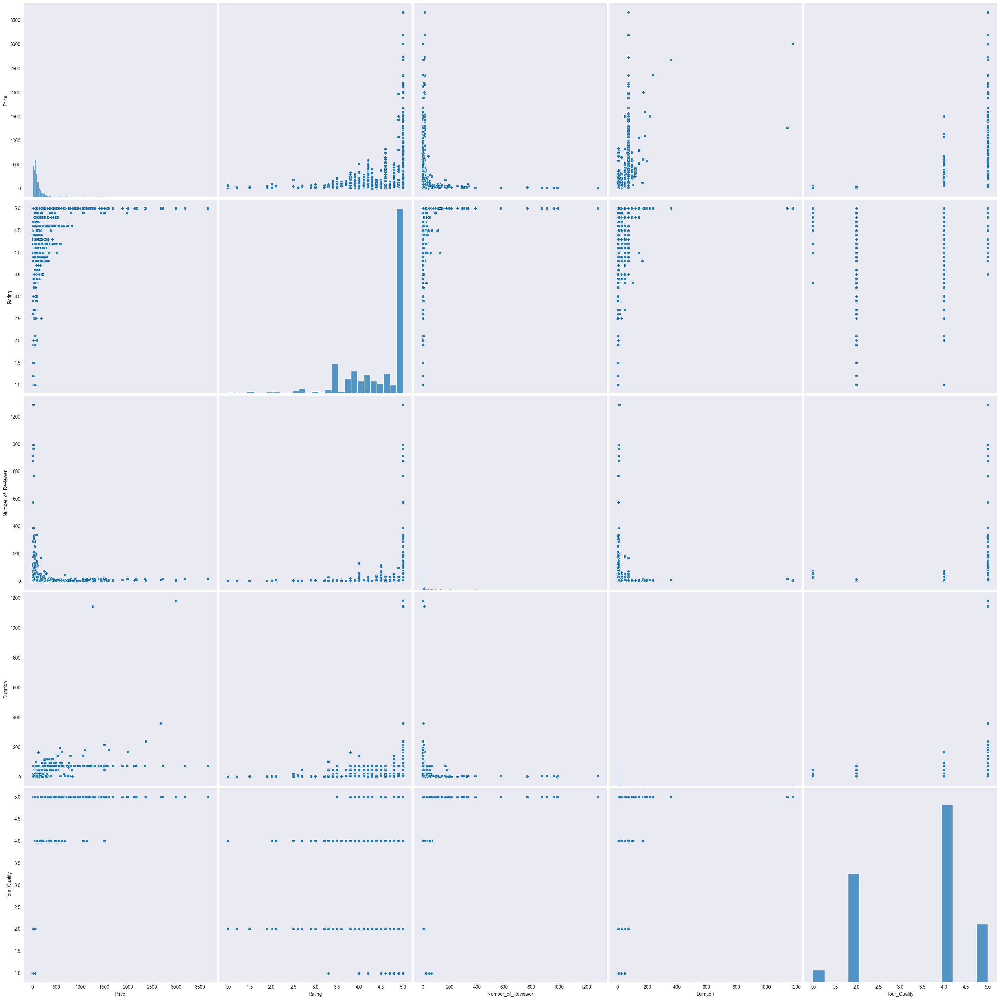

In [42]:
sns.set_style("dark")
cols = ['Price', 'Rating', 'Number_of_Reviewer', 'Duration', 'Tour_Quality']
sns.pairplot(df[cols], height=6)

In [43]:
#sns.pairplot(df)

## Analysis which factor influence on tour price

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_box_violin(df, x_col, y_col):
    sns.set(style="whitegrid")

    # Box plot
    plt.figure(figsize=(10, 6))  # Adjust the figure size if needed
    sns.boxplot(data=df, x=x_col, y=y_col)
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.title('Box Plot of Variable across Categories')
    plt.show()

    # Violin plot
    plt.figure(figsize=(10, 6))  # Adjust the figure size if needed
    sns.violinplot(data=df, x=x_col, y=y_col)
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.title('Violin Plot of Variable across Categories')
    plt.show()


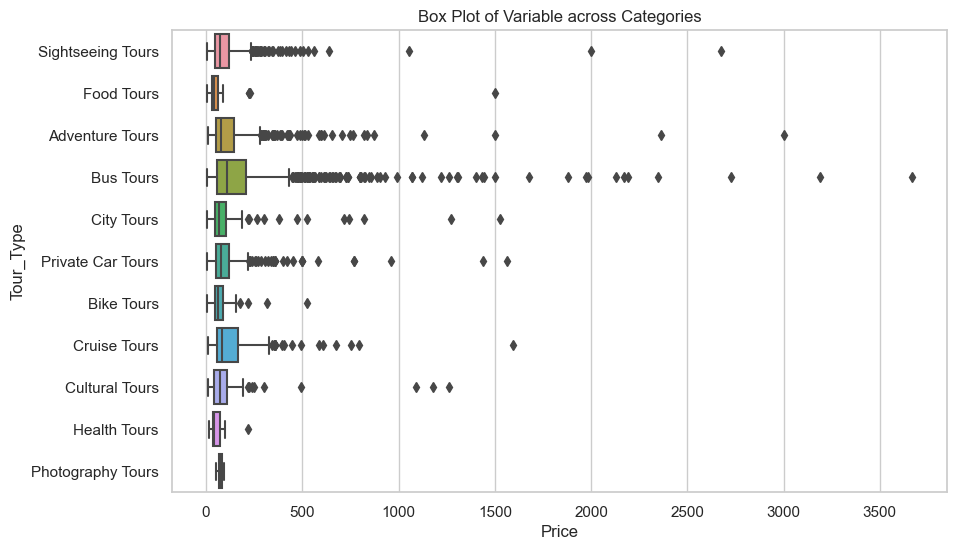

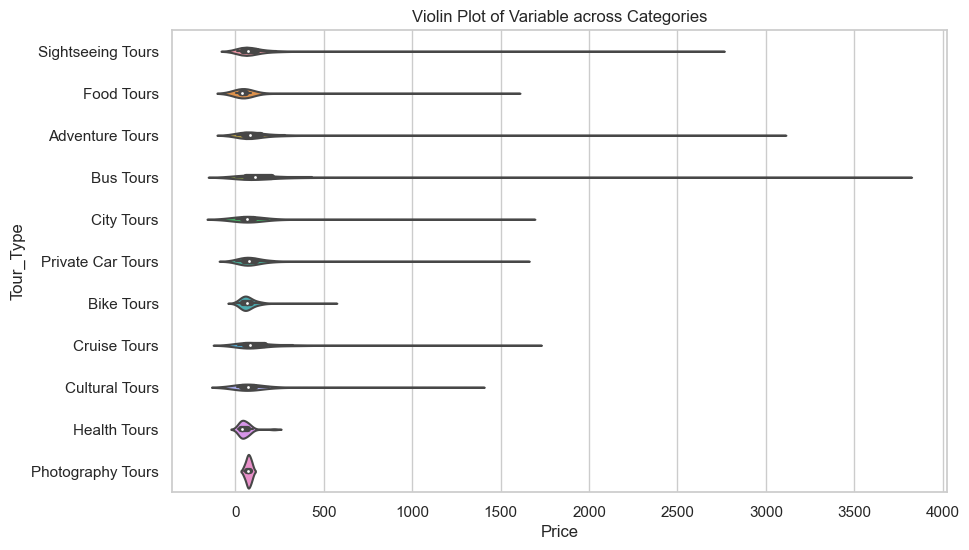

In [45]:
plot_box_violin(df, x_col='Price', y_col='Tour_Type')

**Finding:**  
Base on the boxplot we learn that tour type can affect the price such as:  
* Bus Tour : The most expensive tour is bus tour
* Adventure Tours
* Sightseeing tour
* Cruise Tour

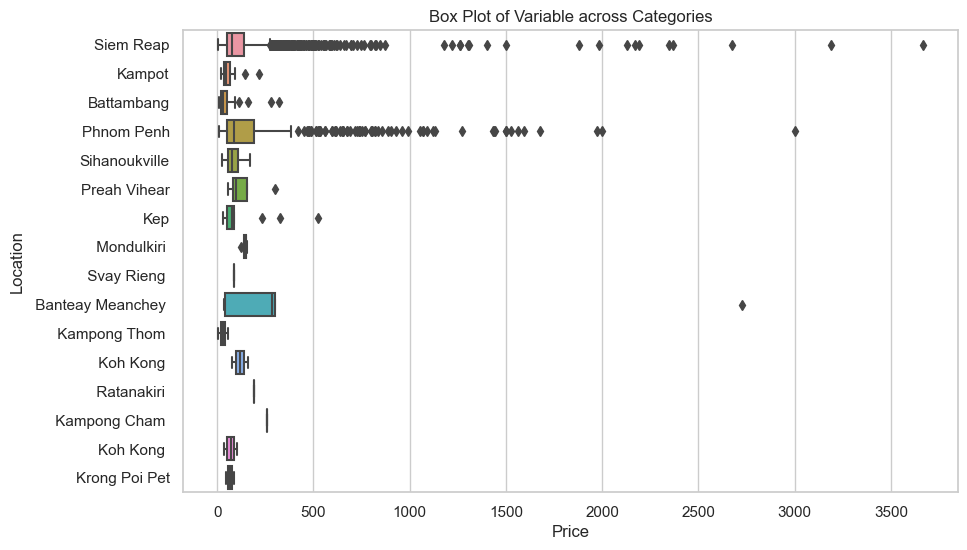

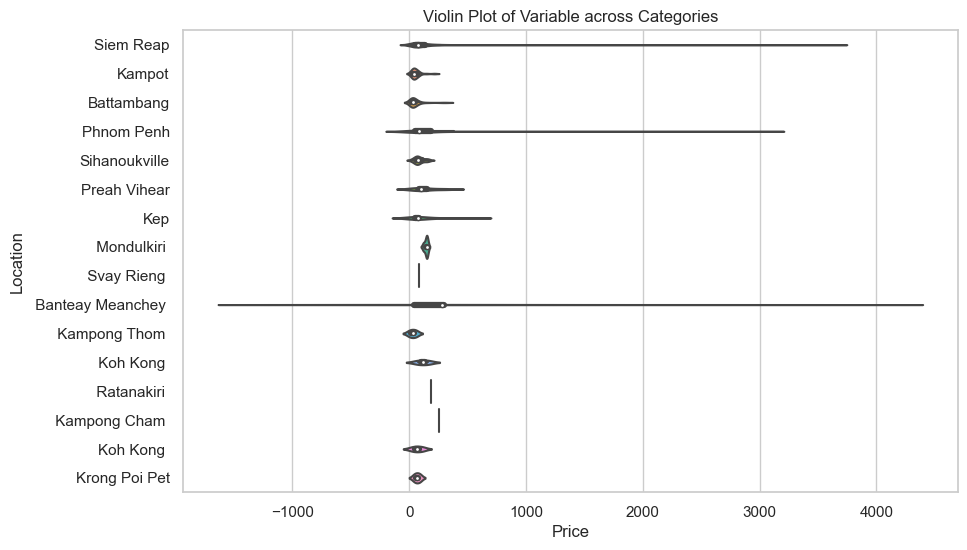

In [46]:
plot_box_violin(df, x_col='Price', y_col='Location') 

**Finding:**  
Base on the boxplot we learn that tour location tend to have high price such as:  
* Siem Reap
* Phnom Penh

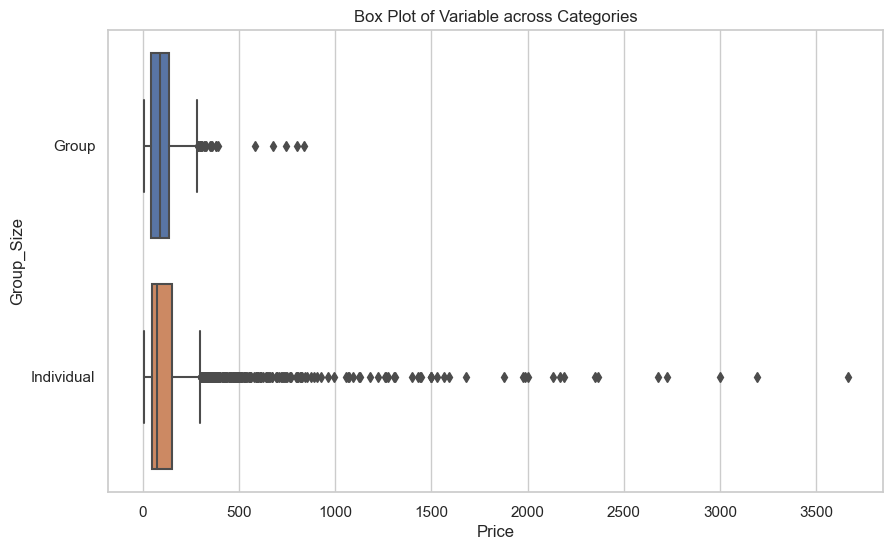

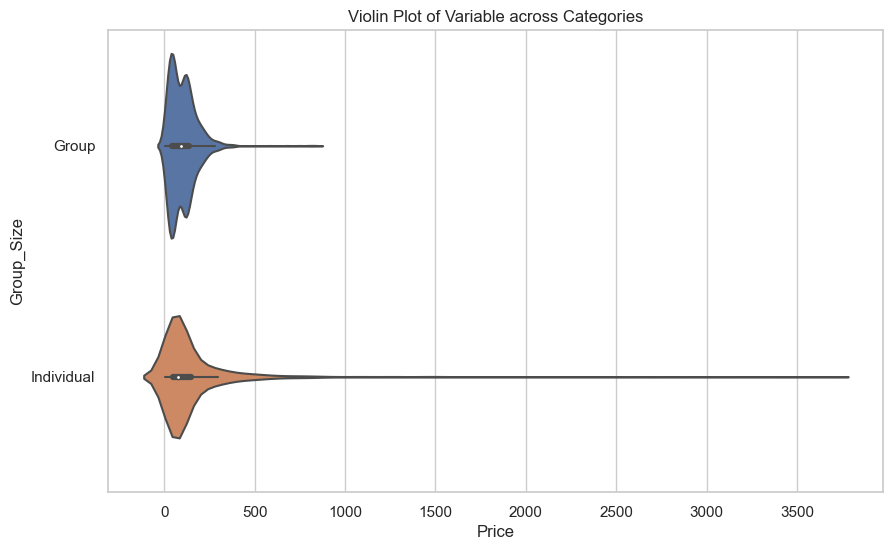

In [47]:
plot_box_violin(df, x_col='Price', y_col='Group_Size')

**Finding:**  
Base on the boxplot we learn that Individual Tour tend to have higher price then group Tour. Why?

## Analysis which factor effect on tour price

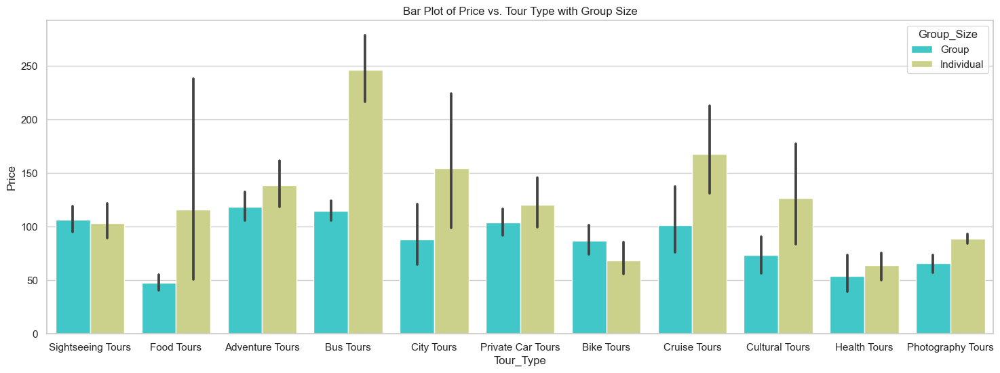

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 6))
sns.barplot(x='Tour_Type', y='Price', hue='Group_Size', data=df, palette='rainbow')
plt.title('Bar Plot of Price vs. Tour Type with Group Size')
plt.show()

**Finding:**    
Base on the Bar Plot we learn that:
* Individual tour tind to have higher price than group tour in most of the tour Type

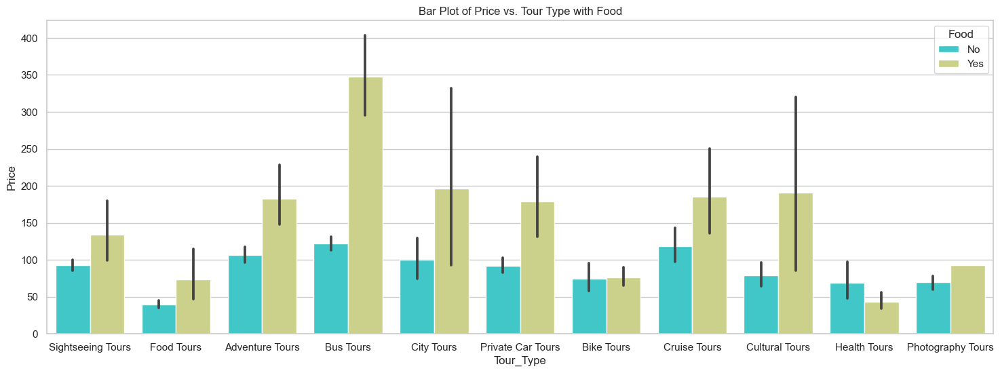

In [49]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 6))
sns.barplot(x='Tour_Type', y='Price', hue='Food', data=df, palette='rainbow')
plt.title('Bar Plot of Price vs. Tour Type with Food')
plt.show()

**Finding:**    
Base on the Bar Plot we learn that:
* Tour that include food in thier package tend to higher price than tour that exclude food

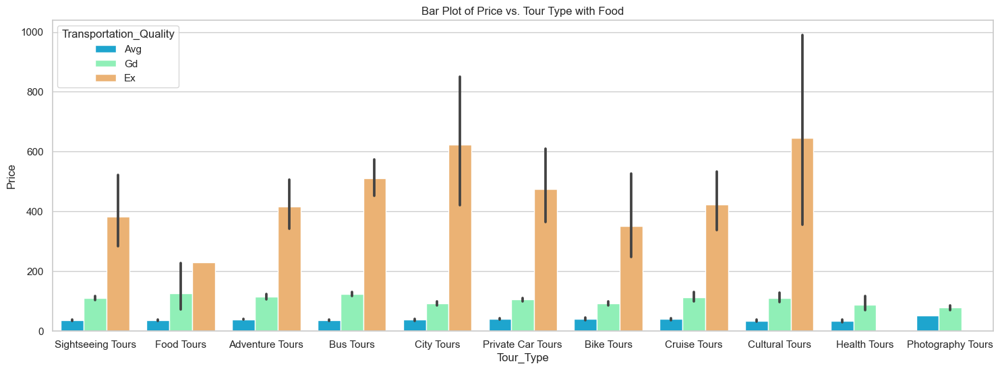

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 6))
sns.barplot(x='Tour_Type', y='Price', hue='Transportation_Quality', data=df, palette='rainbow')
plt.title('Bar Plot of Price vs. Tour Type with Food')
plt.show()

**Finding:**    
Base on the Bar Plot we learn that:
* Tour that have excellent transportation quality tend to have higher price than others

## Correlation Analysis

1. Encode data

In [51]:
from sklearn.preprocessing import LabelEncoder

#Create an instance of LabelEncoder
le=LabelEncoder()

Encode **Group** = 0 and **Individual** = 1

In [52]:
#Column with LabelEncoder
df['Group_Size']=le.fit_transform(df['Group_Size']) 

C:\Users\LH\AppData\Local\Temp\ipykernel_17324\1133201884.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Encode **No** = 0 and **Yes** = 1

In [53]:
df['Food']=le.fit_transform(df['Food'])

C:\Users\LH\AppData\Local\Temp\ipykernel_17324\3691557176.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [54]:
df

,Tour_Name,Tour_Type,Number_of_Reviewer,Rating,Duration,Price,Location,Tour_Popularity,Group_Size,Transportation_Quality,Food,Tour_Quality
0,Phare: The Cambodian Circus Show in Siem Reap,Sightseeing Tours,992.0,5.0,1.0,18.000,Siem Reap,high,0,Avg,0,5
1,Khmer Gourmet Cooking Class,Food Tours,55.0,5.0,3.0,21.500,Siem Reap,meduim,0,Avg,0,1
2,Koh Ker & Beng Mealea Full-Day Join-in Tour,Adventure Tours,288.0,5.0,10.0,50.000,Siem Reap,high,1,Avg,0,5
3,"Kampot Day Tour ""Bokor National Park""",Adventure Tours,18.0,4.5,5.0,36.000,Kampot,low,1,Avg,0,2
4,Bike the Siem Reap Countryside with Local Expert,Adventure Tours,308.0,5.0,5.0,35.000,Siem Reap,high,1,Avg,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...
3123,"Phnom Kulen Tour,Waterfalls,1000 Linga River,R...",Bus Tours,7.4,5.0,7.0,75.000,Siem Reap,low,1,Gd,0,4
3124,Koh Khe Beng Mealea less crowded Private Tour,Cultural Tours,6.6,4.8,10.0,92.232,Siem Reap,low,1,Gd,0,4
3125,Special Angkor Sunrise & Sunset Tour,Sightseeing Tours,7.4,5.0,9.0,61.540,Siem Reap,low,1,Gd,0,4
3126,Most Amazing Angkor Tour,Adventure Tours,1.0,5.0,12.0,92.232,Siem Reap,low,1,Gd,0,4


In [55]:
# Encoding tour_quality
transportation_quality_mapping = {'Avg': 0, 'Gd': 1, 'Ex': 2}
df['Transportation_Quality'] = df['Transportation_Quality'].map(transportation_quality_mapping)

# Encoding transportation_quality
tour_popularity_mapping = {'low': 0, 'meduim': 1, 'high': 2}
df['Tour_Popularity'] = df['Tour_Popularity'].map(tour_popularity_mapping)
df 

C:\Users\LH\AppData\Local\Temp\ipykernel_17324\2041017558.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\LH\AppData\Local\Temp\ipykernel_17324\2041017558.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Tour_Name,Tour_Type,Number_of_Reviewer,Rating,Duration,Price,Location,Tour_Popularity,Group_Size,Transportation_Quality,Food,Tour_Quality
0,Phare: The Cambodian Circus Show in Siem Reap,Sightseeing Tours,992.0,5.0,1.0,18.000,Siem Reap,2,0,0,0,5
1,Khmer Gourmet Cooking Class,Food Tours,55.0,5.0,3.0,21.500,Siem Reap,1,0,0,0,1
2,Koh Ker & Beng Mealea Full-Day Join-in Tour,Adventure Tours,288.0,5.0,10.0,50.000,Siem Reap,2,1,0,0,5
3,"Kampot Day Tour ""Bokor National Park""",Adventure Tours,18.0,4.5,5.0,36.000,Kampot,0,1,0,0,2
4,Bike the Siem Reap Countryside with Local Expert,Adventure Tours,308.0,5.0,5.0,35.000,Siem Reap,2,1,0,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...
3123,"Phnom Kulen Tour,Waterfalls,1000 Linga River,R...",Bus Tours,7.4,5.0,7.0,75.000,Siem Reap,0,1,1,0,4
3124,Koh Khe Beng Mealea less crowded Private Tour,Cultural Tours,6.6,4.8,10.0,92.232,Siem Reap,0,1,1,0,4
3125,Special Angkor Sunrise & Sunset Tour,Sightseeing Tours,7.4,5.0,9.0,61.540,Siem Reap,0,1,1,0,4
3126,Most Amazing Angkor Tour,Adventure Tours,1.0,5.0,12.0,92.232,Siem Reap,0,1,1,0,4


2. Correlation

C:\Users\LH\AppData\Local\Temp\ipykernel_17324\2719273275.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



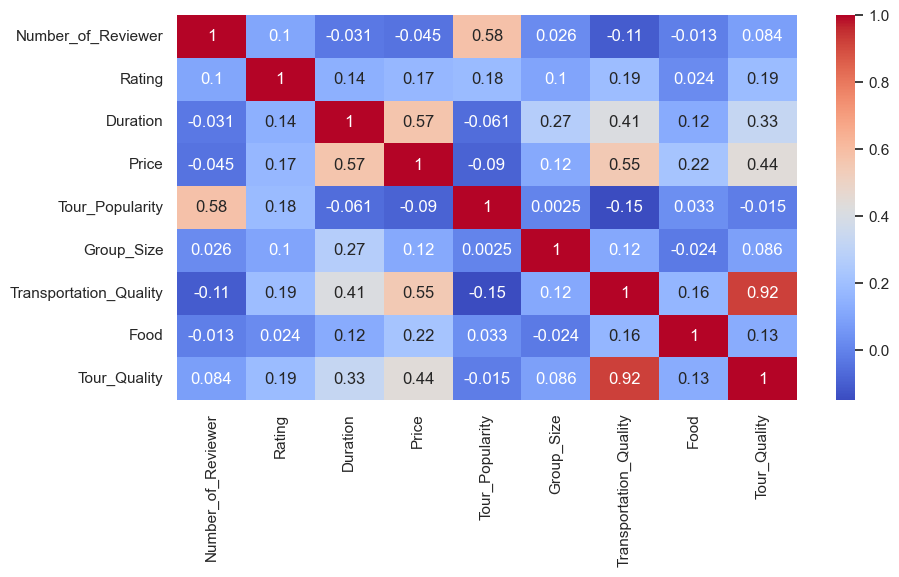

In [56]:
plt.figure(figsize=(10,5))
c= df.corr()
sns.heatmap(c,cmap="coolwarm",annot=True);

Conclusion:  
* **Rating** has correlation with **Price** 0.17  
* **Duration** has correlation with **Price** 0.57  
* **Group_Size** has correlation with **Price** 0.12  
* **Food** has correlation with **Price** 0.22  
* **Tour_Quality** has correlation with **Price** 0.44
* **Transportation_Quality** has correlation with **Price** 0.55  
* Other features has less correlation with **Price**  

**Malticolinearity:**  
* **Tour_Quality** has correlation with **Transportation_Quality** 0.92
* **Tour_Popularity** has correlation with **Number_of_Reviewer** 0.58
* **Transportation_Quality** has correlation with **Duration** 0.41
* **Tour_Quality** has correlation with **Duration** 0.33 

## Analysis the realtionship between tour price with duration 

In [57]:
import plotly.express as px
import plotly.express as px

# create a scatter plot of tour price vs duration
fig = px.scatter(df, x='Duration', y='Price', title='Tour Price vs Duration', color='Duration', color_continuous_scale='rdbu', trendline='ols', template="simple_white")
fig.update_xaxes(title='Duration', range=[-10, 250])
fig.update_yaxes(title='Price ($)', range=[-10, 2500])

# set the size of the plot
fig.update_layout(width=800, height=700)

fig.show()

# calculate the correlation coefficient between two columns
corr_coef = df['Duration'].corr(df['Price'])
print("The correlation coefficient is ", corr_coef)

# check if the correlation is positive or negative
if corr_coef > 0:
    print("The correlation between Duration and Price is positive.")
elif corr_coef < 0:
    print("The correlation between Duration and Price is negative.")
else:
    print("There is no correlation between Duration and Price.")


The correlation coefficient is  0.5652557722944406
The correlation between Duration and Price is positive.


Finding:
* Based on the scatter plot, there appears to be a slight positive correlation between tour duration and tour price, as the trendline slopes upwards. Additionally, the plot shows that there are a variety of ratings for the tours, as seen by the different colors. There does not appear to be any distinct patterns based on rating, as there are highly rated tours at various price and duration levels. The correlation coefficient of 0.56 also supports the idea of a positive correlation, albeit a moderate one. 

<b>Gain insights:</b>Overall, the information on tour prices and durations can recommend tours that fit within a user's budget and time constraints.

In [58]:
import plotly.express as px
import plotly.express as px

# create a scatter plot of tour price vs duration
fig = px.scatter(df, x='Tour_Quality', y='Price', title='Tour Quality vs Duration', color='Duration', color_continuous_scale='rdbu', trendline='ols', template="simple_white")
fig.update_xaxes(title='Tour_Quality')
fig.update_yaxes(title='Price ($)', range=[-10, 2500])

# set the size of the plot
fig.update_layout(width=800, height=700)

fig.show()

# calculate the correlation coefficient between two columns
corr_coef = df['Tour_Quality'].corr(df['Price'])
print("The correlation coefficient is ", corr_coef)

# check if the correlation is positive or negative
if corr_coef > 0:
    print("The correlation between Tour Quality and Price is positive.")
elif corr_coef < 0:
    print("The correlation between Tour Quality and Price is negative.")
else:
    print("There is no correlation between Tour Quality and Price.")

The correlation coefficient is  0.4430856095958962
The correlation between Tour Quality and Price is positive.


In [59]:
import plotly.express as px
import plotly.express as px

# create a scatter plot of tour price vs duration
fig = px.scatter(df, x='Rating', y='Price', title='Tour Quality vs Duration', color='Duration', color_continuous_scale='rdbu', trendline='ols', template="simple_white")
fig.update_xaxes(title='Rating')
fig.update_yaxes(title='Price ($)', range=[-10, 2500])

# set the size of the plot
fig.update_layout(width=800, height=700)

fig.show()

# calculate the correlation coefficient between two columns
corr_coef = df['Rating'].corr(df['Price'])
print("The correlation coefficient is ", corr_coef)

# check if the correlation is positive or negative
if corr_coef > 0:
    print("The correlation between Rating and Price is positive.")
elif corr_coef < 0:
    print("The correlation between Rating and Price is negative.")
else:
    print("There is no correlation between Rating and Price.")

The correlation coefficient is  0.1661841319660939
The correlation between Rating and Price is positive.


# Features Engineering

<h1 style="color:green;">1. Data Tranforming</h1>

C:\Users\LH\AppData\Local\Temp\ipykernel_17324\3743803991.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<AxesSubplot: ylabel='Density'>

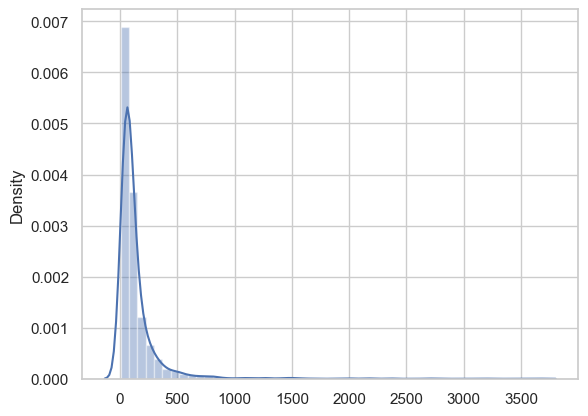

In [60]:
# Look up to skew data (Price Variable)
sns.distplot(df[["Price"]])

C:\Users\LH\AppData\Local\Temp\ipykernel_17324\4139655757.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<AxesSubplot: xlabel='Price', ylabel='Density'>

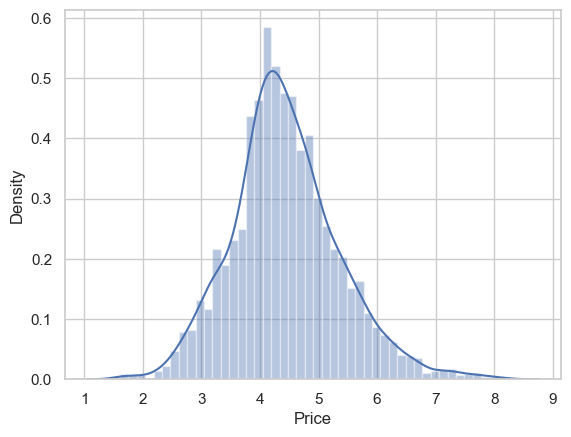

In [61]:
sns.distplot(np.log(df["Price"]))

<h1 style="color:green;">2. Feature Selection</h1>

## One Hot Encode

In [62]:
df_onehot = pd.get_dummies(df,columns=['Tour_Type','Location'])
df_onehot 

,Tour_Name,Number_of_Reviewer,Rating,Duration,Price,Tour_Popularity,Group_Size,Transportation_Quality,Food,Tour_Quality,...,Location_ Svay Rieng,Location_Battambang,Location_Kampot,Location_Kep,Location_Koh Kong,Location_Krong Poi Pet,Location_Phnom Penh,Location_Preah Vihear,Location_Siem Reap,Location_Sihanoukville
0,Phare: The Cambodian Circus Show in Siem Reap,992.0,5.0,1.0,18.000,2,0,0,0,5,...,0,0,0,0,0,0,0,0,1,0
1,Khmer Gourmet Cooking Class,55.0,5.0,3.0,21.500,1,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
2,Koh Ker & Beng Mealea Full-Day Join-in Tour,288.0,5.0,10.0,50.000,2,1,0,0,5,...,0,0,0,0,0,0,0,0,1,0
3,"Kampot Day Tour ""Bokor National Park""",18.0,4.5,5.0,36.000,0,1,0,0,2,...,0,0,1,0,0,0,0,0,0,0
4,Bike the Siem Reap Countryside with Local Expert,308.0,5.0,5.0,35.000,2,1,0,1,5,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3123,"Phnom Kulen Tour,Waterfalls,1000 Linga River,R...",7.4,5.0,7.0,75.000,0,1,1,0,4,...,0,0,0,0,0,0,0,0,1,0
3124,Koh Khe Beng Mealea less crowded Private Tour,6.6,4.8,10.0,92.232,0,1,1,0,4,...,0,0,0,0,0,0,0,0,1,0
3125,Special Angkor Sunrise & Sunset Tour,7.4,5.0,9.0,61.540,0,1,1,0,4,...,0,0,0,0,0,0,0,0,1,0
3126,Most Amazing Angkor Tour,1.0,5.0,12.0,92.232,0,1,1,0,4,...,0,0,0,0,0,0,0,0,1,0


In [63]:
from sklearn.preprocessing import LabelEncoder

#Create an instance of LabelEncoder
le=LabelEncoder()

#Column with LabelEncoder
df_onehot['Tour_Name']=le.fit_transform(df_onehot['Group_Size']) 

                        Feature  Importance
5        Transportation_Quality    0.381623
0            Number_of_Reviewer    0.235033
2                      Duration    0.188560
10          Tour_Type_Bus Tours    0.044690
31          Location_Phnom Penh    0.041835
1                        Rating    0.030210
14         Tour_Type_Food Tours    0.013565
6                          Food    0.013316
33           Location_Siem Reap    0.009233
8     Tour_Type_Adventure Tours    0.008323
13     Tour_Type_Cultural Tours    0.008047
19  Location_ Banteay Meanchey     0.005379
11         Tour_Type_City Tours    0.004879
4                    Group_Size    0.003986
3               Tour_Popularity    0.003059


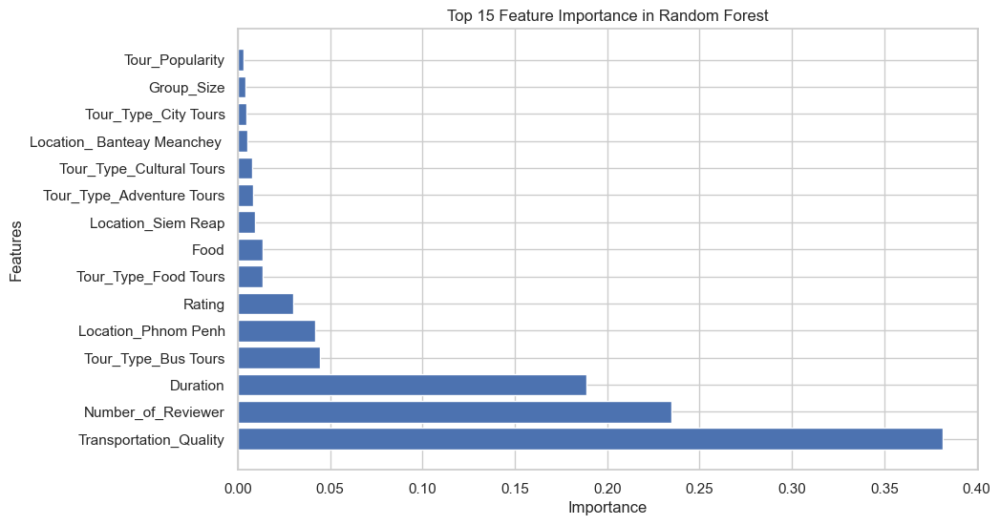

In [64]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

# Step 2: Separate the features (X) and the target variable (y)
X = df_onehot.drop(["Price", "Tour_Name"], axis=1) # Assuming "Price" is your target variable
y = df_onehot["Price"]

# Step 3: Split the data into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Step 4: Train a Random Forest model
rf = RandomForestRegressor()
rf.fit(X_train, y_train)

# Step 5: Obtain feature importances from the trained model
importance = pd.DataFrame({'Feature': X_train.columns, 'Importance': rf.feature_importances_})
importance = importance.sort_values(by='Importance', ascending=False).head(15) # Select top 10 features
print(importance)

# Step 6: Visualize the feature importances using a bar plot
plt.figure(figsize=(10, 6))
plt.barh(importance['Feature'], importance['Importance'])
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Top 15 Feature Importance in Random Forest')
plt.show()

Features selected based on variance threshold:
Index(['Number_of_Reviewer', 'Rating', 'Duration', 'Tour_Popularity',
       'Group_Size', 'Transportation_Quality', 'Food', 'Tour_Quality',
       'Tour_Type_Adventure Tours', 'Tour_Type_Bike Tours',
       'Tour_Type_Bus Tours', 'Tour_Type_City Tours', 'Tour_Type_Cruise Tours',
       'Tour_Type_Cultural Tours', 'Tour_Type_Food Tours',
       'Tour_Type_Health Tours', 'Tour_Type_Photography Tours',
       'Tour_Type_Private Car Tours', 'Tour_Type_Sightseeing Tours',
       'Location_ Banteay Meanchey ', 'Location_ Kampong Cham ',
       'Location_ Kampong Thom ', 'Location_ Koh Kong ',
       'Location_ Mondulkiri ', 'Location_ Ratanakiri ',
       'Location_ Svay Rieng ', 'Location_Battambang', 'Location_Kampot',
       'Location_Kep', 'Location_Koh Kong ', 'Location_Krong Poi Pet',
       'Location_Phnom Penh', 'Location_Preah Vihear', 'Location_Siem Reap',
       'Location_Sihanoukville'],
      dtype='object')

Features selected base

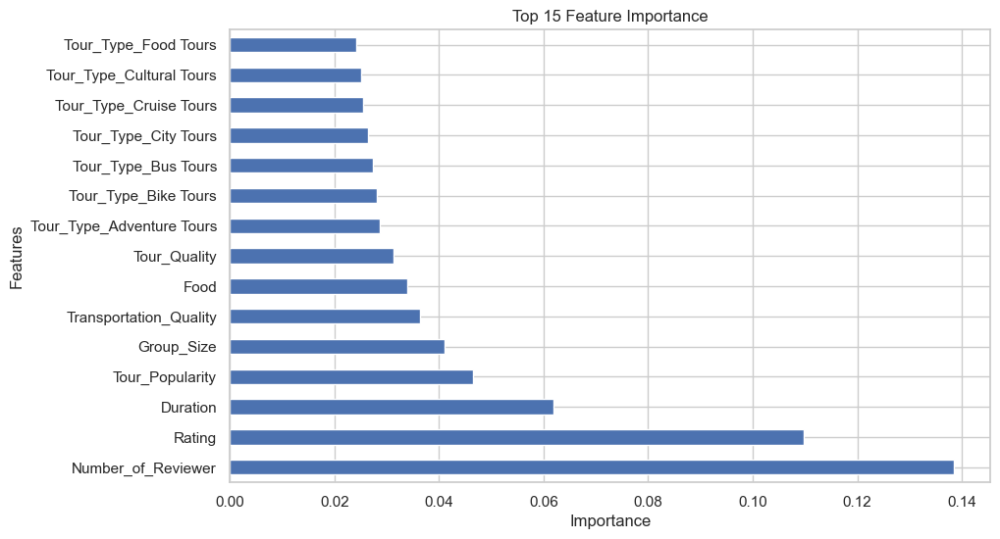

In [65]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Step 3: Separate the features (X) from the target variable (y), if available
X = df_onehot.drop(["Price", "Tour_Name"], axis=1)  # Assuming "Price" is your target variable

# Step 4: Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 5: Variance-based feature selection
variance_threshold = 0.75  # Set your desired variance threshold
var_selector = VarianceThreshold(threshold=variance_threshold)
X_selected_variance = var_selector.fit_transform(X_scaled)
selected_variance_features = X.columns[var_selector.get_support()]

# Step 6: Covariance-based feature selection
covariance_matrix = np.cov(X_scaled.T)
pca = PCA(n_components=len(X.columns))
pca.fit(covariance_matrix)
explained_variance_ratio = pca.explained_variance_ratio_
selected_covariance_features = X.columns[:len(explained_variance_ratio)]

# Step 7: Print and compare the selected features
print("Features selected based on variance threshold:")
print(selected_variance_features)
print("\nFeatures selected based on covariance-based feature selection:")
print(selected_covariance_features[:15])  # Show only top 15 features

# Bar graph for feature importance
plt.figure(figsize=(10, 6))
feature_importance = pd.Series(explained_variance_ratio, index=X.columns)
feature_importance = feature_importance.sort_values(ascending=False)[:15]  # Select top 15 features
feature_importance.plot(kind='barh')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Top 15 Feature Importance')
plt.show()

## Target Encode

In [66]:
import pandas as pd

# Step 1: Prepare the dataset
# Load the 'df' dataset, assuming it contains the categorical variables and the target variable

# Create a new dataset to store the encoded data
df_target = df.copy()

# Step 2: Compute target statistics with regularization
# Calculate the target statistics for each categorical variable in the dataset with regularization
smoothing_factor = 0.5  # Smoothing factor for regularization
global_mean = df['Price'].mean()  # Overall mean of the target variable

# Define a function to apply target encoding with regularization
def target_encode(data, target, categorical_variable, smoothing):
    encoded_name = categorical_variable + '_encoded'
    agg = data.groupby(categorical_variable)[target].agg(['mean', 'count'])
    mean = agg['mean']
    count = agg['count']
    smooth_mean = (global_mean * smoothing + mean * count) / (smoothing + count)
    data[encoded_name] = data[categorical_variable].map(smooth_mean)

# Apply target encoding with regularization for each categorical variable
categorical_variables = ['Tour_Type','Location']
for variable in categorical_variables:
    target_encode(df_target , 'Price', variable, smoothing_factor)

# Step 3: Replace the original categorical variables with the encoded columns
for variable in categorical_variables:
    encoded_name = variable + '_encoded'
    df_target[variable] = df_target[encoded_name]
    df_target.drop(encoded_name, axis=1, inplace=True)

# Print the encoded dataset
df_target 


,Tour_Name,Tour_Type,Number_of_Reviewer,Rating,Duration,Price,Location,Tour_Popularity,Group_Size,Transportation_Quality,Food,Tour_Quality
0,Phare: The Cambodian Circus Show in Siem Reap,104.064491,992.0,5.0,1.0,18.000,127.881844,2,0,0,0,5
1,Khmer Gourmet Cooking Class,62.434242,55.0,5.0,3.0,21.500,127.881844,1,0,0,0,1
2,Koh Ker & Beng Mealea Full-Day Join-in Tour,132.943390,288.0,5.0,10.0,50.000,127.881844,2,1,0,0,5
3,"Kampot Day Tour ""Bokor National Park""",132.943390,18.0,4.5,5.0,36.000,56.754873,0,1,0,0,2
4,Bike the Siem Reap Countryside with Local Expert,132.943390,308.0,5.0,5.0,35.000,127.881844,2,1,0,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...
3123,"Phnom Kulen Tour,Waterfalls,1000 Linga River,R...",197.713888,7.4,5.0,7.0,75.000,127.881844,0,1,1,0,4
3124,Koh Khe Beng Mealea less crowded Private Tour,109.791393,6.6,4.8,10.0,92.232,127.881844,0,1,1,0,4
3125,Special Angkor Sunrise & Sunset Tour,104.064491,7.4,5.0,9.0,61.540,127.881844,0,1,1,0,4
3126,Most Amazing Angkor Tour,132.943390,1.0,5.0,12.0,92.232,127.881844,0,1,1,0,4


                  Feature  Importance
7  Transportation_Quality    0.376630
1      Number_of_Reviewer    0.248859
3                Duration    0.195207
0               Tour_Type    0.069217
4                Location    0.052385
2                  Rating    0.035010
8                    Food    0.017647
6              Group_Size    0.003240
5         Tour_Popularity    0.001392
9            Tour_Quality    0.000413


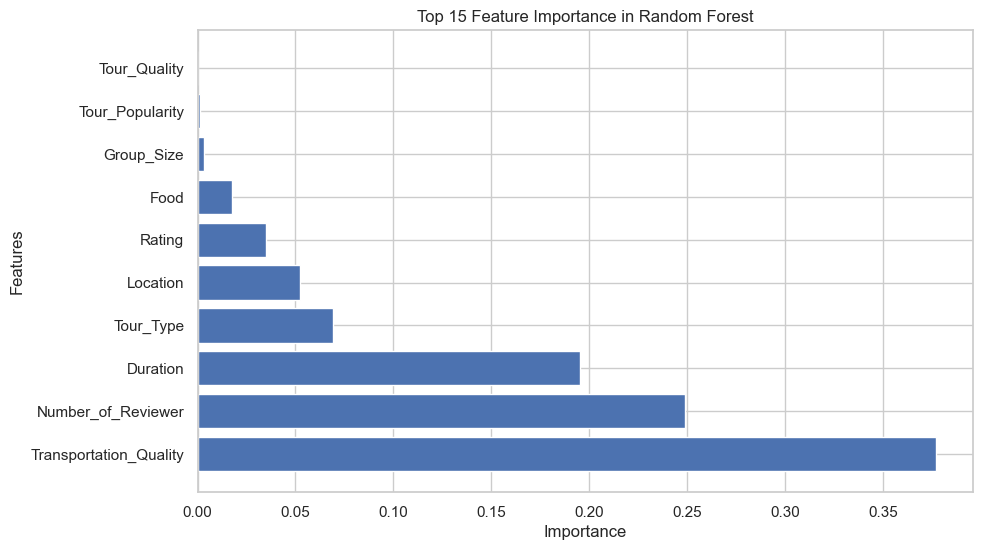

In [67]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

# Step 2: Separate the features (X) and the target variable (y)
X = df_target.drop(["Price", "Tour_Name"], axis=1) # Assuming "Price" is your target variable
y = df_target["Price"]

# Step 3: Split the data into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Step 4: Train a Random Forest model
rf = RandomForestRegressor()
rf.fit(X_train, y_train)

# Step 5: Obtain feature importances from the trained model
importance = pd.DataFrame({'Feature': X_train.columns, 'Importance': rf.feature_importances_})
importance = importance.sort_values(by='Importance', ascending=False).head(15) # Select top 10 features
print(importance)

# Step 6: Visualize the feature importances using a bar plot
plt.figure(figsize=(10, 6))
plt.barh(importance['Feature'], importance['Importance'])
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Top 15 Feature Importance in Random Forest')
plt.show()

Features selected based on variance threshold:
Index(['Tour_Type', 'Number_of_Reviewer', 'Rating', 'Duration', 'Location',
       'Tour_Popularity', 'Group_Size', 'Transportation_Quality', 'Food',
       'Tour_Quality'],
      dtype='object')

Features selected based on covariance-based feature selection:
Index(['Tour_Type', 'Number_of_Reviewer', 'Rating', 'Duration', 'Location',
       'Tour_Popularity', 'Group_Size', 'Transportation_Quality', 'Food',
       'Tour_Quality'],
      dtype='object')


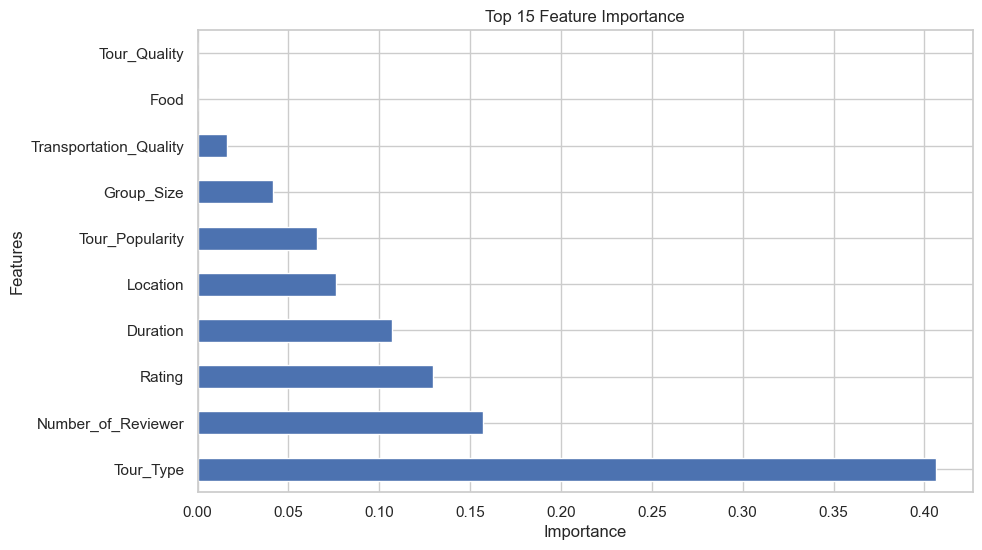

In [68]:
import pandas as pd       
import numpy as np
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Step 3: Separate the features (X) from the target variable (y), if available
X = df_target.drop(["Price", "Tour_Name"], axis=1)  # Assuming "Price" is your target variable

# Step 4: Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 5: Variance-based feature selection
variance_threshold = 0.75  # Set your desired variance threshold
var_selector = VarianceThreshold(threshold=variance_threshold)
X_selected_variance = var_selector.fit_transform(X_scaled)
selected_variance_features = X.columns[var_selector.get_support()]

# Step 6: Covariance-based feature selection
covariance_matrix = np.cov(X_scaled.T)
pca = PCA(n_components=len(X.columns))
pca.fit(covariance_matrix)
explained_variance_ratio = pca.explained_variance_ratio_
selected_covariance_features = X.columns[:len(explained_variance_ratio)]

# Step 7: Print and compare the selected features
print("Features selected based on variance threshold:")
print(selected_variance_features)
print("\nFeatures selected based on covariance-based feature selection:")
print(selected_covariance_features[:15])  # Show only top 15 features

# Bar graph for feature importance
plt.figure(figsize=(10, 6))
feature_importance = pd.Series(explained_variance_ratio, index=X.columns)
feature_importance = feature_importance.sort_values(ascending=False)[:15]  # Select top 15 features
feature_importance.plot(kind='barh')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Top 15 Feature Importance')
plt.show()


In [69]:
corr_matrix = df.corr()
# Find the features with correlation coefficient >= 0.5
highly_correlated_features = corr_matrix[corr_matrix >= 0.5].stack()

# Display the highly correlated features
print(highly_correlated_features)

Number_of_Reviewer      Number_of_Reviewer        1.000000
                        Tour_Popularity           0.581636
Rating                  Rating                    1.000000
Duration                Duration                  1.000000
                        Price                     0.565256
Price                   Duration                  0.565256
                        Price                     1.000000
                        Transportation_Quality    0.547781
Tour_Popularity         Number_of_Reviewer        0.581636
                        Tour_Popularity           1.000000
Group_Size              Group_Size                1.000000
Transportation_Quality  Price                     0.547781
                        Transportation_Quality    1.000000
                        Tour_Quality              0.919797
Food                    Food                      1.000000
Tour_Quality            Transportation_Quality    0.919797
                        Tour_Quality              1.0000

C:\Users\LH\AppData\Local\Temp\ipykernel_17324\1197424792.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



In [70]:
for column in df.columns:
    unique_values = df[column].unique()
    unique_values.sort()  # Sort the unique values in ascending order
    print(f"Content values in {column}:\n {unique_values}\n")

Content values in Tour_Name:
 [' 1 Day Amazing Angkor Wat Small Circuit Tour with Sunrise (The Most Popular)'
 ' 1-Day Amazing Angkor Wat Small Circuit & Sunrise'
 ' 1-Day Wonder Angkor Wat Small Circuit Tour with Sunset' ...
 'half day Kompong Pluk Floating Village Morning Tour By Join-in'
 'one day small circuit tour sunrise with Lunch plus Massage 60min'
 'private taxi in Angkor wat temple and other place- provinces in Cambodia.']

Content values in Tour_Type:
 ['Adventure Tours' 'Bike Tours' 'Bus Tours' 'City Tours' 'Cruise Tours'
 'Cultural Tours' 'Food Tours' 'Health Tours' 'Photography Tours'
 'Private Car Tours' 'Sightseeing Tours']

Content values in Number_of_Reviewer:
 [1.000e+00 1.200e+00 1.400e+00 1.600e+00 1.800e+00 2.000e+00 2.200e+00
 2.400e+00 2.600e+00 2.800e+00 3.000e+00 3.200e+00 3.400e+00 3.600e+00
 3.800e+00 4.000e+00 4.200e+00 4.400e+00 4.600e+00 4.800e+00 5.000e+00
 5.200e+00 5.400e+00 5.600e+00 5.800e+00 6.000e+00 6.200e+00 6.400e+00
 6.600e+00 6.800e+00 7.000e

# <font color = green|><b> 3.) Model building 

#### <b><font color = green|>Split data into training and testing set 

In [97]:
from sklearn.model_selection import train_test_split

# Split the dataset into features (X) and target variable (y)
X = df_onehot.drop(["Price", "Tour_Name"], axis=1)
y = df_onehot['Price']

# Split the data into train and test sets with a 50% ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

# Check the shape of the original data and the split data
print("Original Data Shape:", df_onehot.shape)
print("X_train Shape:", X_train.shape)
print("X_test Shape:", X_test.shape)
print("y_train Shape:", y_train.shape)
print("y_test Shape:", y_test.shape)

Original Data Shape: (3126, 37)
X_train Shape: (1563, 35)
X_test Shape: (1563, 35)
y_train Shape: (1563,)
y_test Shape: (1563,)


In [98]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

#### <font color = green|><b>a.) Simple Linear Regression Model

In [99]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

def print_score(regressor, X_train, y_train, X_test, y_test, train=True):
    if train:
        y_train_pred = regressor.predict(X_train)
        mse_train = mean_squared_error(y_train, y_train_pred)
        r2_train = r2_score(y_train, y_train_pred)
        
        print("Train Result:\n================================================")
        print(f"Mean Squared Error: {mse_train:.2f}")
        print(f"R-squared: {r2_train:.2f}")
        print("_______________________________________________")
        
    else:
        y_test_pred = regressor.predict(X_test)
        mse_test = mean_squared_error(y_test, y_test_pred)
        r2_test = r2_score(y_test, y_test_pred)
        
        print("Test Result:\n================================================")
        print(f"Mean Squared Error: {mse_test:.2f}")
        print(f"R-squared: {r2_test:.2f}")
        print("_______________________________________________")

# Create a LinearRegression model
lr_clf = LinearRegression()

# Fit the model on the training data
lr_clf.fit(X_train, y_train)

# Evaluate and print the scores
print_score(lr_clf, X_train, y_train, X_test, y_test, train=True)
print_score(lr_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Mean Squared Error: 30779.69
R-squared: 0.50
_______________________________________________
Test Result:
Mean Squared Error: 23711.14
R-squared: 0.45
_______________________________________________


In [100]:
import statsmodels.api as sm

# Create a LinearRegression model
lr_clf = LinearRegression()

# Fit the model on the training data
lr_clf.fit(X_train, y_train)

# Add a constant column to the X_train dataset
X_train_with_const = sm.add_constant(X_train)

# Fit the OLS (Ordinary Least Squares) model
ols_model = sm.OLS(y_train, X_train_with_const)
ols_result = ols_model.fit()

# Print the regression statistics table
print(ols_result.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.502
Model:                            OLS   Adj. R-squared:                  0.491
Method:                 Least Squares   F-statistic:                     46.64
Date:                Thu, 13 Jul 2023   Prob (F-statistic):          1.51e-204
Time:                        23:10:20   Log-Likelihood:                -10294.
No. Observations:                1563   AIC:                         2.066e+04
Df Residuals:                    1529   BIC:                         2.084e+04
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

In [101]:
X_train.columns

Index(['Number_of_Reviewer', 'Rating', 'Duration', 'Tour_Popularity',
       'Group_Size', 'Transportation_Quality', 'Food', 'Tour_Quality',
       'Tour_Type_Adventure Tours', 'Tour_Type_Bike Tours',
       'Tour_Type_Bus Tours', 'Tour_Type_City Tours', 'Tour_Type_Cruise Tours',
       'Tour_Type_Cultural Tours', 'Tour_Type_Food Tours',
       'Tour_Type_Health Tours', 'Tour_Type_Photography Tours',
       'Tour_Type_Private Car Tours', 'Tour_Type_Sightseeing Tours',
       'Location_ Banteay Meanchey ', 'Location_ Kampong Cham ',
       'Location_ Kampong Thom ', 'Location_ Koh Kong ',
       'Location_ Mondulkiri ', 'Location_ Ratanakiri ',
       'Location_ Svay Rieng ', 'Location_Battambang', 'Location_Kampot',
       'Location_Kep', 'Location_Koh Kong ', 'Location_Krong Poi Pet',
       'Location_Phnom Penh', 'Location_Preah Vihear', 'Location_Siem Reap',
       'Location_Sihanoukville'],
      dtype='object')

##### `Features Vs Price using Simple Linear Regression`

In [102]:
import statsmodels.api as sm

# Select the desired feature for the regression
for column in X_train.columns:
    print(f'{column} Vs Price \n')
    selected_feature = X_train[column]

    # Add a constant column to the selected feature
    X_train_with_const = sm.add_constant(selected_feature)

    # Fit the OLS (Ordinary Least Squares) model
    ols_model = sm.OLS(y_train, X_train_with_const)
    ols_result = ols_model.fit()

    # Print the regression statistics table
    print(ols_result.summary())
    print('__________________________________________________________________________________________________ \n\n')

Number_of_Reviewer Vs Price 

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     3.016
Date:                Thu, 13 Jul 2023   Prob (F-statistic):             0.0827
Time:                        23:10:22   Log-Likelihood:                -10837.
No. Observations:                1563   AIC:                         2.168e+04
Df Residuals:                    1561   BIC:                         2.169e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const 

##### `Predict Price by using Duration`

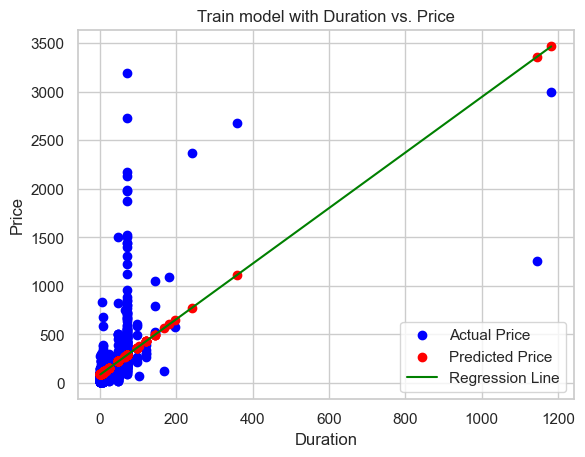

In [103]:
import numpy as np
import matplotlib.pyplot as plt

# Add a constant column to the 'Duration' feature
X_train_with_const = sm.add_constant(X_train['Duration'])

# Fit the OLS (Ordinary Least Squares) model
ols_model = sm.OLS(y_train, X_train_with_const)
ols_result = ols_model.fit()

# Make predictions using the trained model
y_pred = ols_result.predict(X_train_with_const)

# Calculate the regression line
regression_line = np.polyfit(X_train['Duration'], y_pred, 1)
line_x = np.array([X_train['Duration'].min(), X_train['Duration'].max()])
line_y = regression_line[0] * line_x + regression_line[1]

# Plot the scatter plot and regression line
plt.scatter(X_train['Duration'], y_train, color='blue', label='Actual Price')
plt.scatter(X_train['Duration'], y_pred, color='red', label='Predicted Price')
plt.plot(line_x, line_y, color='green', label='Regression Line')
plt.xlabel('Duration')
plt.ylabel('Price')
plt.title('Train model with Duration vs. Price')
plt.legend()
plt.show()

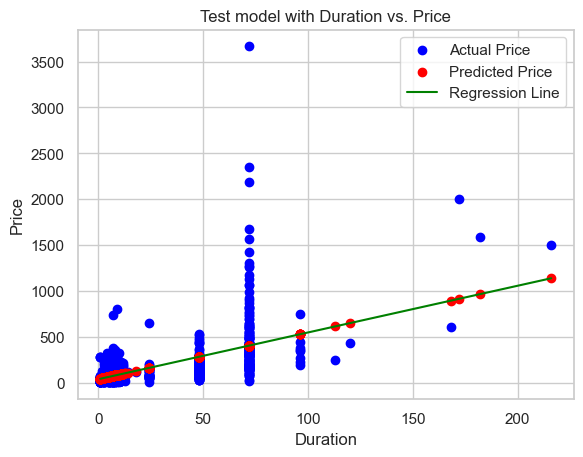

In [104]:
import numpy as np
import matplotlib.pyplot as plt

# Add a constant column to the 'Duration' feature
X_test_with_const = sm.add_constant(X_test['Duration'])

# Fit the OLS (Ordinary Least Squares) model
ols_model = sm.OLS(y_test, X_test_with_const)
ols_result = ols_model.fit()

# Make predictions using the trained model
y_pred = ols_result.predict(X_test_with_const)

# Calculate the regression line
regression_line = np.polyfit(X_test['Duration'], y_pred, 1)
line_x = np.array([X_test['Duration'].min(), X_test['Duration'].max()])
line_y = regression_line[0] * line_x + regression_line[1]

# Plot the scatter plot and regression line
plt.scatter(X_test['Duration'], y_test, color='blue', label='Actual Price')
plt.scatter(X_test['Duration'], y_pred, color='red', label='Predicted Price')
plt.plot(line_x, line_y, color='green', label='Regression Line')
plt.xlabel('Duration')
plt.ylabel('Price')
plt.title('Test model with Duration vs. Price')
plt.legend()
plt.show()

##### `Predict Price by using Transportation_Quality`

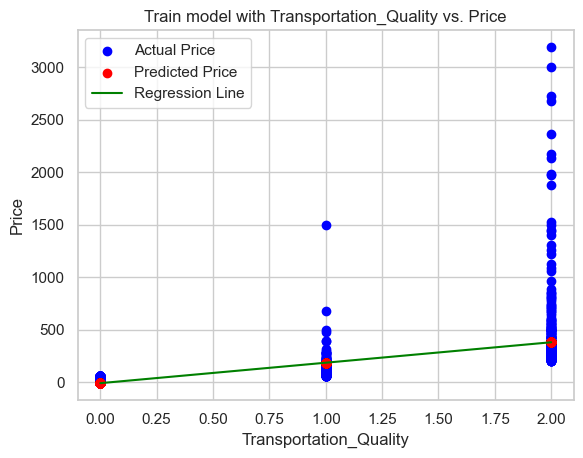

In [105]:
import numpy as np
import matplotlib.pyplot as plt

# Add a constant column to the 'Transportation_Quality' feature
X_train_with_const = sm.add_constant(X_train['Transportation_Quality'])

# Fit the OLS (Ordinary Least Squares) model
ols_model = sm.OLS(y_train, X_train_with_const)
ols_result = ols_model.fit()

# Make predictions using the trained model
y_pred = ols_result.predict(X_train_with_const)

# Calculate the regression line
regression_line = np.polyfit(X_train['Transportation_Quality'], y_pred, 1)
line_x = np.array([X_train['Transportation_Quality'].min(), X_train['Transportation_Quality'].max()])
line_y = regression_line[0] * line_x + regression_line[1]

# Plot the scatter plot and regression line
plt.scatter(X_train['Transportation_Quality'], y_train, color='blue', label='Actual Price')
plt.scatter(X_train['Transportation_Quality'], y_pred, color='red', label='Predicted Price')
plt.plot(line_x, line_y, color='green', label='Regression Line')
plt.xlabel('Transportation_Quality')
plt.ylabel('Price')
plt.title('Train model with Transportation_Quality vs. Price')
plt.legend()
plt.show()


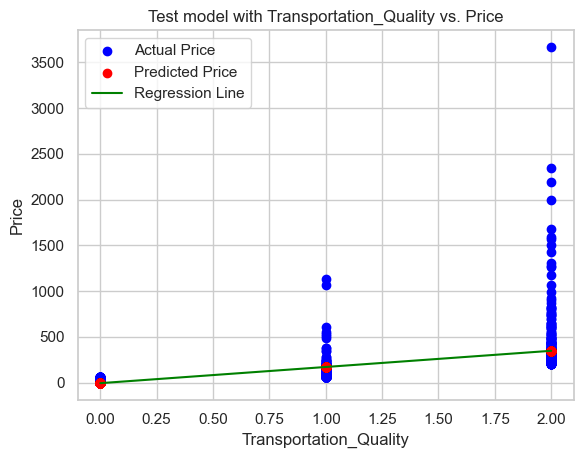

In [106]:
# Add a constant column to the 'Transportation_Quality' feature
X_test_with_const = sm.add_constant(X_test['Transportation_Quality'])

# Fit the OLS (Ordinary Least Squares) model
ols_model = sm.OLS(y_test, X_test_with_const)
ols_result = ols_model.fit()

# Make predictions using the trained model
y_pred = ols_result.predict(X_test_with_const)

# Calculate the regression line
regression_line = np.polyfit(X_test['Transportation_Quality'], y_pred, 1)
line_x = np.array([X_test['Transportation_Quality'].min(), X_test['Transportation_Quality'].max()])
line_y = regression_line[0] * line_x + regression_line[1]

# Plot the scatter plot and regression line
plt.scatter(X_test['Transportation_Quality'], y_test, color='blue', label='Actual Price')
plt.scatter(X_test['Transportation_Quality'], y_pred, color='red', label='Predicted Price')
plt.plot(line_x, line_y, color='green', label='Regression Line')
plt.xlabel('Transportation_Quality')
plt.ylabel('Price')
plt.title('Test model with Transportation_Quality vs. Price')
plt.legend()
plt.show()

##### `Predict Price by using `

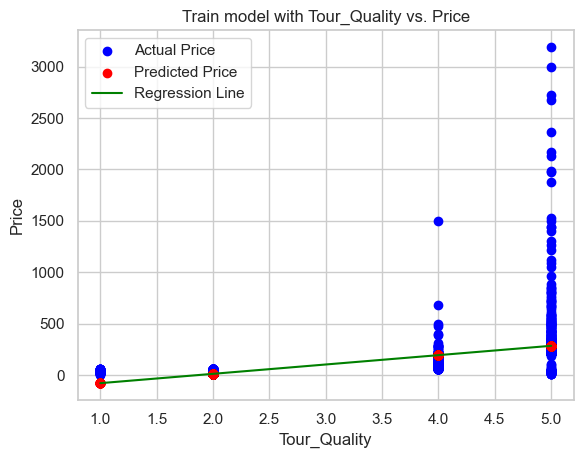

In [107]:
# Add a constant column to the 'Transportation_Quality' feature
X_train_with_const = sm.add_constant(X_train['Tour_Quality'])

# Fit the OLS (Ordinary Least Squares) model
ols_model = sm.OLS(y_train, X_train_with_const)
ols_result = ols_model.fit()

# Make predictions using the trained model
y_pred = ols_result.predict(X_train_with_const)

# Calculate the regression line
regression_line = np.polyfit(X_train['Tour_Quality'], y_pred, 1)
line_x = np.array([X_train['Tour_Quality'].min(), X_train['Tour_Quality'].max()])
line_y = regression_line[0] * line_x + regression_line[1]

# Plot the scatter plot and regression line
plt.scatter(X_train['Tour_Quality'], y_train, color='blue', label='Actual Price')
plt.scatter(X_train['Tour_Quality'], y_pred, color='red', label='Predicted Price')
plt.plot(line_x, line_y, color='green', label='Regression Line')
plt.xlabel('Tour_Quality')
plt.ylabel('Price')
plt.title('Train model with Tour_Quality vs. Price')
plt.legend()
plt.show()     

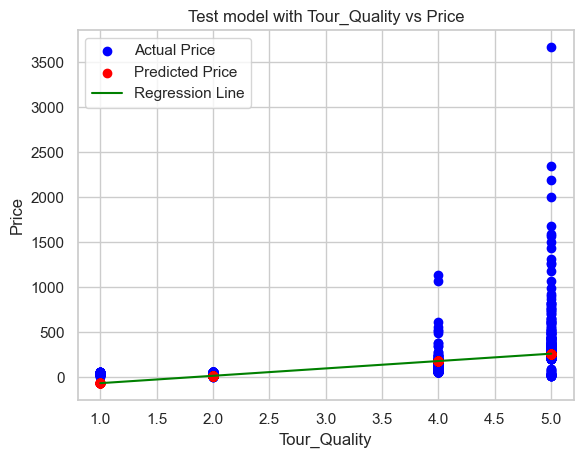

In [108]:
# Add a constant column to the 'Transportation_Quality' feature
X_test_with_const = sm.add_constant(X_test['Tour_Quality'])

# Fit the OLS (Ordinary Least Squares) model
ols_model = sm.OLS(y_test, X_test_with_const)
ols_result = ols_model.fit()

# Make predictions using the trained model
y_pred = ols_result.predict(X_test_with_const)

# Calculate the regression line
regression_line = np.polyfit(X_test['Tour_Quality'], y_pred, 1)
line_x = np.array([X_test['Tour_Quality'].min(), X_test['Tour_Quality'].max()])
line_y = regression_line[0] * line_x + regression_line[1]

# Plot the scatter plot and regression line
plt.scatter(X_test['Tour_Quality'], y_test, color='blue', label='Actual Price')
plt.scatter(X_test['Tour_Quality'], y_pred, color='red', label='Predicted Price')
plt.plot(line_x, line_y, color='green', label='Regression Line')
plt.xlabel('Tour_Quality')
plt.ylabel('Price')
plt.title('Test model with Tour_Quality vs Price')
plt.legend()
plt.show()     

#### <font color = green|><b>b.) Multilinear Regression Model

In [111]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.model_selection import train_test_split

X = df_onehot.drop(["Price", "Tour_Name"], axis=1)
y = df_onehot['Price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

regressors = [LinearRegression(), LinearRegression(normalize=True)]
for i,regressor in enumerate(regressors):
        if i == 0:
            print("Train Result:\n================================================")
        else:
            print("\nTest Result:\n================================================")
        
        regressor.fit(X_train, y_train)
        
        y_train_pred = regressor.predict(X_train)
        mse_train = mean_squared_error(y_train, y_train_pred)
        r2_train = r2_score(y_train, y_train_pred)
        
        print(f"Model {i+1}:")
        print(f"Mean Squared Error (Train): {mse_train:.2f}")
        print(f"R-squared (Train): {r2_train:.2f}")
        
        y_test_pred = regressor.predict(X_test)
        mse_test = mean_squared_error(y_test, y_test_pred)
        r2_test = r2_score(y_test, y_test_pred)
        
        print(f"Mean Squared Error (Test): {mse_test:.2f}")
        print(f"R-squared (Test): {r2_test:.2f}")
        print("_______________________________________________")

Train Result:
Model 1:
Mean Squared Error (Train): 30779.69
R-squared (Train): 0.50
Mean Squared Error (Test): 23711.14
R-squared (Test): 0.45
_______________________________________________

Test Result:
Model 2:
Mean Squared Error (Train): 30878.35
R-squared (Train): 0.50
Mean Squared Error (Test): 23936.29
R-squared (Test): 0.45
_______________________________________________


c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)





Train Result:
Mean Squared Error: 30779.69
R-squared: 0.50

Test Result:
Mean Squared Error: 23711.14
R-squared: 0.45


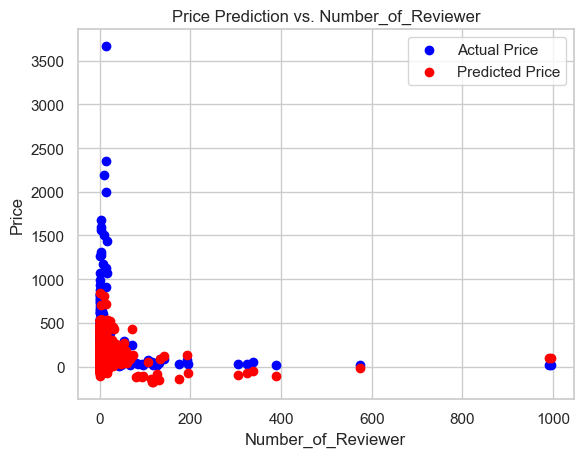

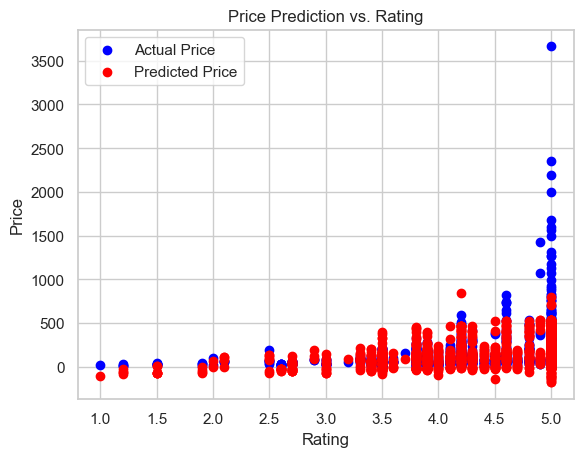

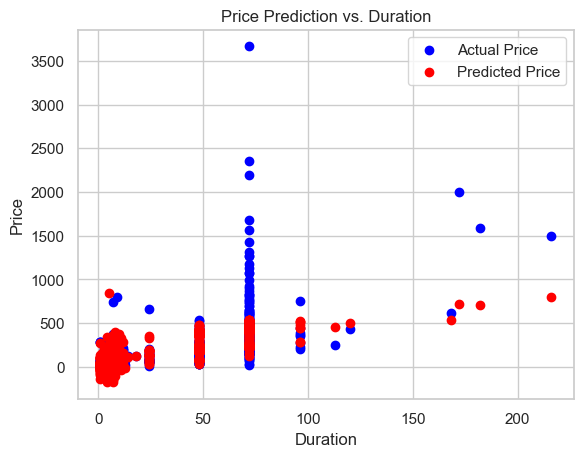

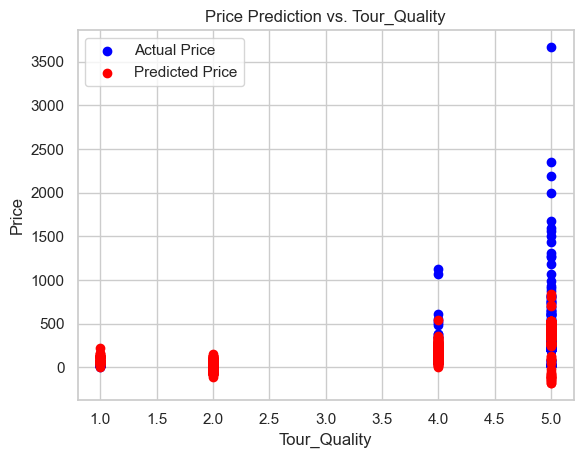

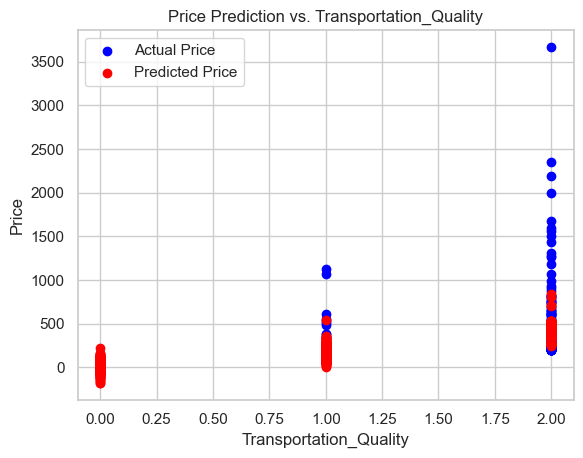

In [112]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Select the features for the regression
select_feature = ['Number_of_Reviewer', 'Rating', 'Duration', 'Tour_Quality','Transportation_Quality']

# Prepare the data
X = df[select_feature]
y = df['Price']

# Define the linear regression model
model = LinearRegression()

# Fit the model on the training data
model.fit(X_train, y_train)

# Make predictions on the training and testing data
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Evaluate the model
mse_train = mean_squared_error(y_train, y_train_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print the evaluation scores
print("Train Result:")
print(f"Mean Squared Error: {mse_train:.2f}")
print(f"R-squared: {r2_train:.2f}")
print("\nTest Result:")
print(f"Mean Squared Error: {mse_test:.2f}")
print(f"R-squared: {r2_test:.2f}")

for column in select_feature:
    # Plot the predicted prices against the predictor
    plt.scatter(X_test[column], y_test, color='blue', label='Actual Price')
    plt.scatter(X_test[column], y_test_pred, color='red', label='Predicted Price')
    plt.xlabel(f'{column}')
    plt.ylabel('Price')
    plt.title(f'Price Prediction vs. {column}')
    plt.legend()
    plt.show()

#### <font color = green|><b>c.) Polynomial Regression Model

In [113]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

X = df_onehot.drop(["Price", "Tour_Name"], axis=1)
y = df_onehot['Price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

def print_score(regressors, X_train, y_train, X_test, y_test):
    for i, regressor in enumerate(regressors):
        if i == 0:
            print("Train Result:\n================================================")
        else:
            print("\nTest Result:\n================================================")
        
        regressor.fit(X_train, y_train)
        
        y_train_pred = regressor.predict(X_train)
        mse_train = mean_squared_error(y_train, y_train_pred)
        r2_train = r2_score(y_train, y_train_pred)
        
        print(f"Model {i+1}:")
        print(f"Mean Squared Error (Train): {mse_train:.2f}")
        print(f"R-squared (Train): {r2_train:.2f}")
        
        y_test_pred = regressor.predict(X_test)
        mse_test = mean_squared_error(y_test, y_test_pred)
        r2_test = r2_score(y_test, y_test_pred)
        
        print(f"Mean Squared Error (Test): {mse_test:.2f}")
        print(f"R-squared (Test): {r2_test:.2f}")
        print("_______________________________________________")

# Create polynomial features
degree = 2
poly_features = PolynomialFeatures(degree=degree)
X_train_poly = poly_features.fit_transform(X_train)
X_test_poly = poly_features.transform(X_test)

# Create a list of polynomial regression models
regressors = [LinearRegression(), LinearRegression(normalize=True)]

# Evaluate and print the scores for all models
print_score(regressors, X_train_poly, y_train, X_test_poly, y_test)

Train Result:
Model 1:
Mean Squared Error (Train): 16754.54
R-squared (Train): 0.73
Mean Squared Error (Test): 21959.43
R-squared (Test): 0.49
_______________________________________________

Test Result:


c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)





Model 2:
Mean Squared Error (Train): 16909.87
R-squared (Train): 0.73
Mean Squared Error (Test): 1416687019638054469801743482880.00
R-squared (Test): -32589320687533560501895168.00
_______________________________________________


In [115]:
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Create polynomial features
poly_features = PolynomialFeatures(degree=2, include_bias=False)
X_poly_train = poly_features.fit_transform(X_train)

# Get the names of the polynomial features
poly_feature_names = poly_features.get_feature_names(X_train.columns)

# Fit a linear regression model on polynomial features
regressor = LinearRegression()
regressor.fit(X_poly_train, y_train)

# LinearRegression(fit_intercept=True, normalize=False, copy_X=True, n_jobs=None)


# Get coefficients
coefficients = regressor.coef_

# Create a DataFrame for the regression table
regression_table = pd.DataFrame({'Feature': poly_feature_names, 'Coefficient': coefficients})

# Print the regression table
print(regression_table)

c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



                                          Feature  Coefficient
0                              Number_of_Reviewer   -14.558078
1                                          Rating   235.214096
2                                        Duration     4.124545
3                                 Tour_Popularity   501.996576
4                                      Group_Size   -20.436617
..                                            ...          ...
660      Location_Preah Vihear Location_Siem Reap     0.000000
661  Location_Preah Vihear Location_Sihanoukville     0.000000
662                          Location_Siem Reap^2    26.594322
663     Location_Siem Reap Location_Sihanoukville     0.000000
664                      Location_Sihanoukville^2   -97.398213

[665 rows x 2 columns]


In [116]:
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Create polynomial features
poly_features = PolynomialFeatures(degree=2, include_bias=False)
X_poly_train = poly_features.fit_transform(X_train)

# Get the names of the polynomial features
poly_feature_names = poly_features.get_feature_names_out(X_train.columns)

# Fit a linear regression model on polynomial features
regressor = LinearRegression()
regressor.fit(X_poly_train, y_train)

# Get coefficients
coefficients = regressor.coef_

# Filter out features with coefficient < 0
nonzero_mask = coefficients < 0
nonzero_feature_names = poly_feature_names[nonzero_mask]
nonzero_coefficients = coefficients[nonzero_mask]

# Create a DataFrame for the regression table
regression_table = pd.DataFrame({'Feature': nonzero_feature_names, 'Coefficient': nonzero_coefficients})

# Print the regression table
print(regression_table)

                           Feature  Coefficient
0               Number_of_Reviewer   -14.558078
1                       Group_Size   -20.436617
2                             Food    -1.911857
3                     Tour_Quality   -57.902449
4        Tour_Type_Adventure Tours   -12.246562
..                             ...          ...
151  Location_ Banteay Meanchey ^2    -8.694756
152      Location_ Kampong Cham ^2    -0.093105
153                 Location_Kep^2    -5.458554
154       Location_Krong Poi Pet^2    -0.416211
155       Location_Sihanoukville^2   -97.398213

[156 rows x 2 columns]


In [117]:
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Create polynomial features
poly_features = PolynomialFeatures(degree=2, include_bias=False)
X_poly_train = poly_features.fit_transform(X_train)

# Get the names of the polynomial features
poly_feature_names = poly_features.get_feature_names_out(X_train.columns)

# Fit a linear regression model on polynomial features
regressor = LinearRegression()
regressor.fit(X_poly_train, y_train)

# Get coefficients
coefficients = regressor.coef_

# Filter out features with coefficient = 0
nonzero_mask = coefficients > 0
nonzero_feature_names = poly_feature_names[nonzero_mask]
nonzero_coefficients = coefficients[nonzero_mask]

# Create a DataFrame for the regression table
regression_table = pd.DataFrame({'Feature': nonzero_feature_names, 'Coefficient': nonzero_coefficients})

# Print the regression table
print(regression_table)

                     Feature  Coefficient
0                     Rating   235.214096
1                   Duration     4.124545
2            Tour_Popularity   501.996576
3     Transportation_Quality   104.303397
4        Tour_Type_Bus Tours    22.786726
..                       ...          ...
202        Location_Kampot^2    27.605565
203     Location_Koh Kong ^2     0.173168
204    Location_Phnom Penh^2    12.928871
205  Location_Preah Vihear^2     3.757293
206     Location_Siem Reap^2    26.594322

[207 rows x 2 columns]


##### `Polynomial with degree 1`

      Actual Price  Predicted Price
2997        243.92       233.131063
2131         95.00       188.831188
1730         60.00        72.388765
1369         26.90       -15.360416
557         102.57       129.236115
...            ...              ...
3094         52.73         3.315651
1096         34.00        42.701456
1131        246.16       397.877303
1295         20.00        56.357105
861         144.00       314.079613

[1563 rows x 2 columns]


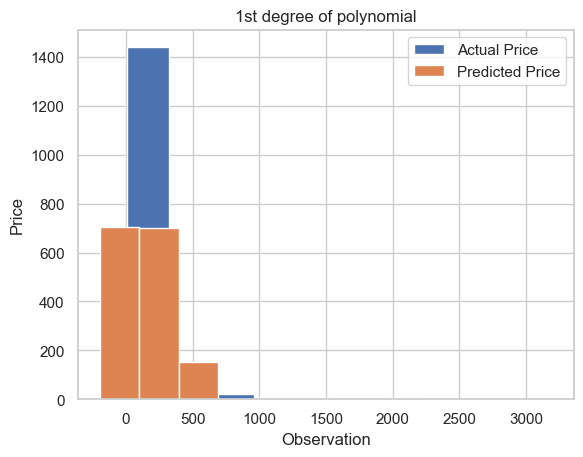

In [118]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Create polynomial features
poly_features = PolynomialFeatures(degree=1, include_bias=False)
X_poly_train = poly_features.fit_transform(X_train)

# Train the polynomial regression model
regressor = LinearRegression()
regressor.fit(X_poly_train, y_train)

# Predict the Price for new data
new_observation = X_train  # Replace ... with the rest of the feature values
new_observation_poly = poly_features.transform(new_observation)
predicted_price = regressor.predict(new_observation_poly)

# Concatenate actual and predicted values
results = pd.DataFrame({'Actual Price': y_train, 'Predicted Price': predicted_price})

# Print the results
print(results)

# Plot the Actual Price and Predicted Price
plt.hist(results['Actual Price'], label='Actual Price')
plt.hist(results['Predicted Price'], label='Predicted Price')
plt.xlabel('Observation')
plt.ylabel('Price')
plt.title('1st degree of polynomial')
plt.legend()
plt.show()

##### `Polynomial with degree 2`

      Actual Price  Predicted Price
2997        243.92       184.282206
2131         95.00        93.007382
1730         60.00       109.362423
1369         26.90        44.879464
557         102.57        81.513598
...            ...              ...
3094         52.73        21.274683
1096         34.00        45.801794
1131        246.16       218.748309
1295         20.00         9.481602
861         144.00       256.665466

[1563 rows x 2 columns]


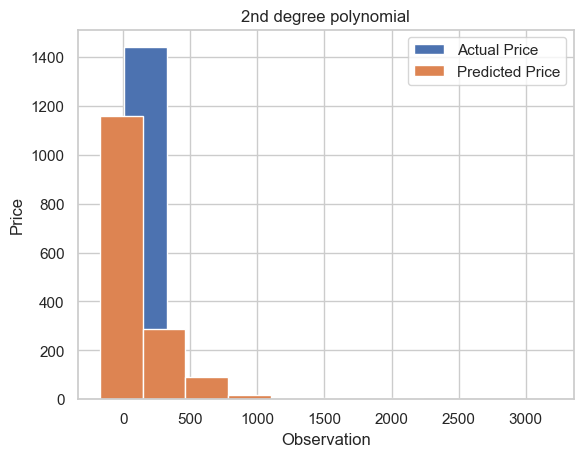

In [119]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Create polynomial features
poly_features = PolynomialFeatures(degree=2, include_bias=False)
X_poly_train = poly_features.fit_transform(X_train)

# Train the polynomial regression model
regressor = LinearRegression()
regressor.fit(X_poly_train, y_train)

# Predict the Price for new data
new_observation = X_train  # Replace ... with the rest of the feature values
new_observation_poly = poly_features.transform(new_observation)
predicted_price = regressor.predict(new_observation_poly)

# Concatenate actual and predicted values
results = pd.DataFrame({'Actual Price': y_train, 'Predicted Price': predicted_price})

# Print the results
print(results)

# Plot the Actual Price and Predicted Price
plt.hist(results['Actual Price'], label='Actual Price')
plt.hist(results['Predicted Price'], label='Predicted Price')
plt.xlabel('Observation')
plt.ylabel('Price')
plt.title('2nd degree polynomial')
plt.legend()
plt.show()

##### `Polynomial with degree 3` We cannot choose it because R^2 < 0

      Actual Price  Predicted Price
2997        243.92       169.773112
2131         95.00       117.009073
1730         60.00        74.518380
1369         26.90        31.457392
557         102.57        34.264431
...            ...              ...
3094         52.73        63.287491
1096         34.00        48.215942
1131        246.16       494.424710
1295         20.00        54.555952
861         144.00       241.367137

[1563 rows x 2 columns]


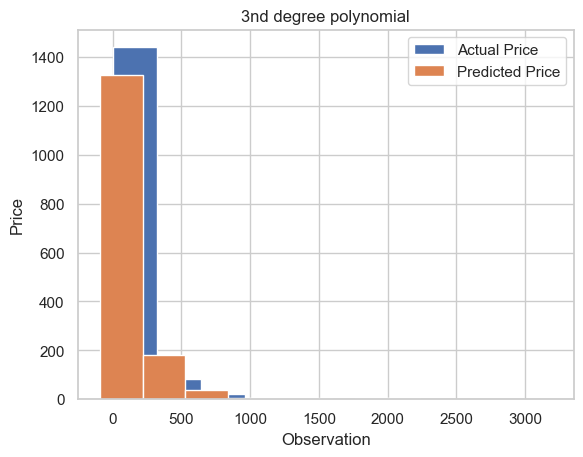

In [121]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Create polynomial features
poly_features = PolynomialFeatures(degree=3, include_bias=False)
X_poly_train = poly_features.fit_transform(X_train)

# Train the polynomial regression model
regressor = LinearRegression()
regressor.fit(X_poly_train, y_train)

# Predict the Price for new data
new_observation = X_train  # Replace ... with the rest of the feature values
new_observation_poly = poly_features.transform(new_observation)
predicted_price = regressor.predict(new_observation_poly)

# Concatenate actual and predicted values
results = pd.DataFrame({'Actual Price': y_train, 'Predicted Price': predicted_price})

# Print the results
print(results)

# Plot the Actual Price and Predicted Price
plt.hist(results['Actual Price'], label='Actual Price')
plt.hist(results['Predicted Price'], label='Predicted Price')
plt.xlabel('Observation')
plt.ylabel('Price')
plt.title('3nd degree polynomial')
plt.legend()
plt.show()

#### <font color = green|><b>d.) Lasso regression model

In [124]:
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score

X = df_onehot.drop(["Price", "Tour_Name"], axis=1)
y = df_onehot['Price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

def print_score(regressors, X_train, y_train, X_test, y_test):
    for i, regressor in enumerate(regressors):
        if i == 0:
            print("Train Result:\n================================================")
        else:
            print("\nTest Result:\n================================================")
        
        regressor.fit(X_train, y_train)
        
        y_train_pred = regressor.predict(X_train)
        mse_train = mean_squared_error(y_train, y_train_pred)
        r2_train = r2_score(y_train, y_train_pred)
        
        print(f"Model {i+1}:")
        print(f"Mean Squared Error (Train): {mse_train:.2f}")
        print(f"R-squared (Train): {r2_train:.2f}")
        
        y_test_pred = regressor.predict(X_test)
        mse_test = mean_squared_error(y_test, y_test_pred)
        r2_test = r2_score(y_test, y_test_pred)
        
        print(f"Mean Squared Error (Test): {mse_test:.2f}")
        print(f"R-squared (Test): {r2_test:.2f}")
        print("_______________________________________________")

# Create Lasso regression models with different regularization strengths
alpha_values = [0.1,0.5,1.0]
regressors = [Lasso(alpha=alpha) for alpha in alpha_values]

# Evaluate and print the scores for all models
print_score(regressors, X_train, y_train, X_test, y_test)

Train Result:
Model 1:
Mean Squared Error (Train): 30815.33
R-squared (Train): 0.50
Mean Squared Error (Test): 23639.37
R-squared (Test): 0.46
_______________________________________________

Test Result:
Model 2:
Mean Squared Error (Train): 30977.98
R-squared (Train): 0.50
Mean Squared Error (Test): 23541.09
R-squared (Test): 0.46
_______________________________________________

Test Result:
Model 3:
Mean Squared Error (Train): 31352.49
R-squared (Train): 0.49
Mean Squared Error (Test): 23527.50
R-squared (Test): 0.46
_______________________________________________


      Actual Value  Predicted Value
1189        102.57       161.710120
1135         97.44       101.839035
2160        320.00       415.296643
1468         76.93       177.015662
1073        134.62       194.433890
...            ...              ...
1568        255.00       222.803441
132          18.47      -131.206850
2011        133.34       154.501903
2930         60.00       154.608734
421          22.00        91.036350

[1563 rows x 2 columns]


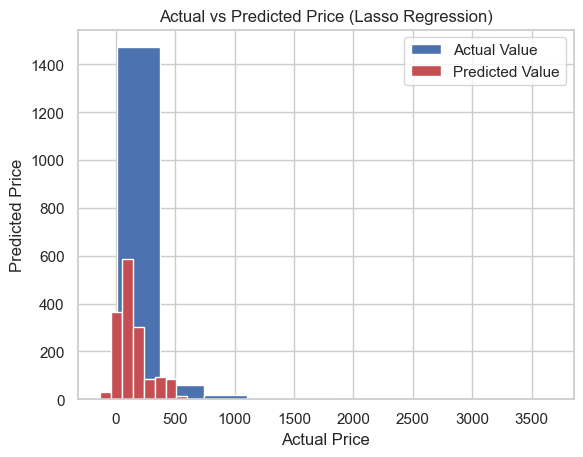

Mean Squared Error: 23527.50034170764
R-squared: 0.458775831935088


In [125]:
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score

# Create Lasso regression model
lasso = Lasso(alpha=1.0)

# Lasso(alpha=1.0, fit_intercept=True, normalize=False, precompute=False, copy_X=True, max_iter=1000, tol=0.0001, warm_start=False, positive=False, random_state=None, selection='cyclic')


# Fit the model on the training data
lasso.fit(X_train, y_train)

# Predict the Price for the test data
y_pred = lasso.predict(X_test)

data = pd.DataFrame({'Actual Value':y_test,'Predicted Value':y_pred})
print(data)

# Plot scatterplot of actual vs predicted values with different colors
plt.hist(y_test, color='b', label='Actual Value')
plt.hist(y_pred, color='r', label='Predicted Value')
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('Actual vs Predicted Price (Lasso Regression)')
plt.legend()
plt.show()

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r2)


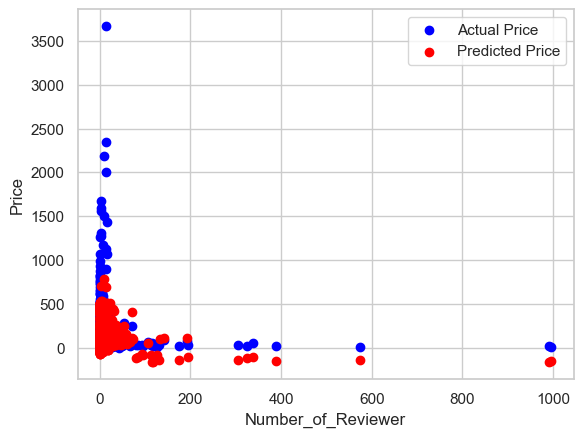

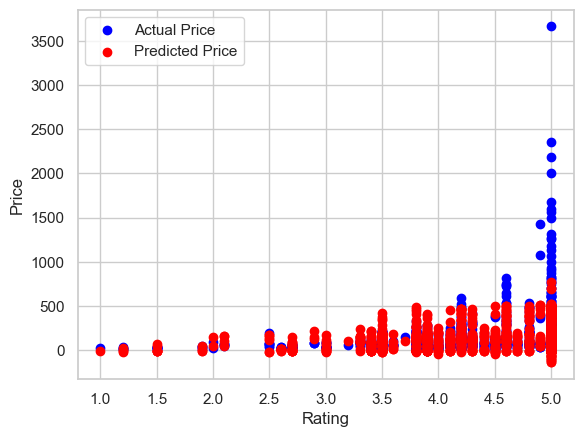

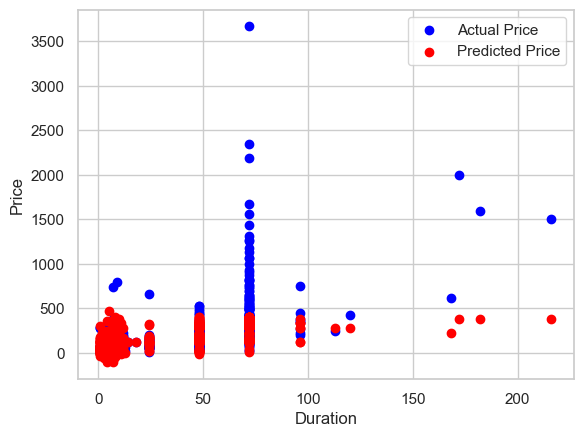

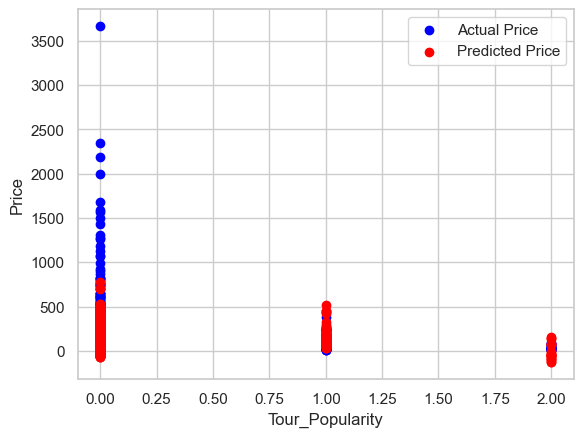

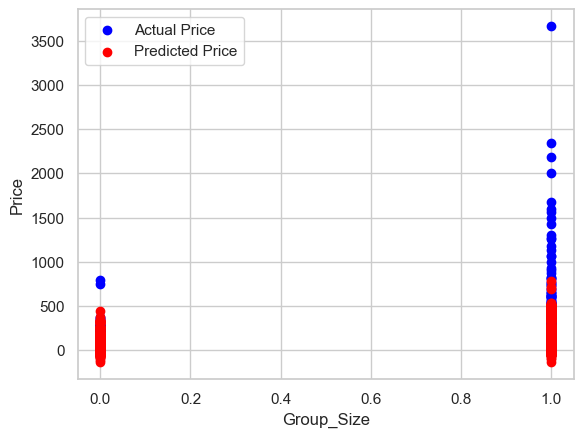

...

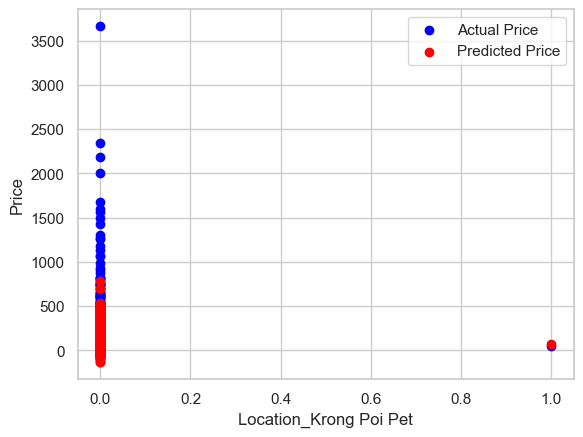

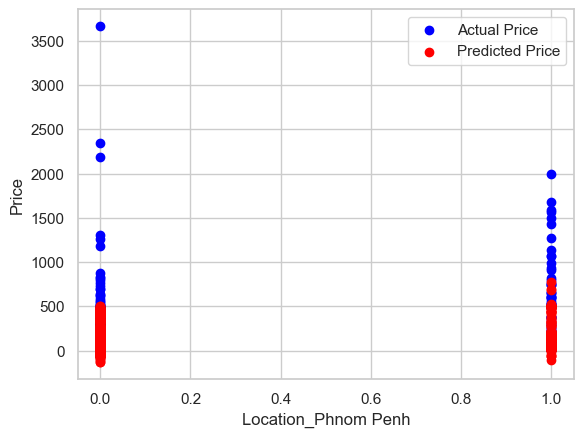

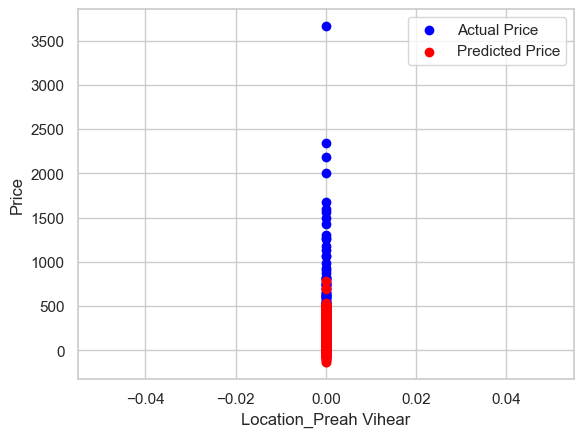

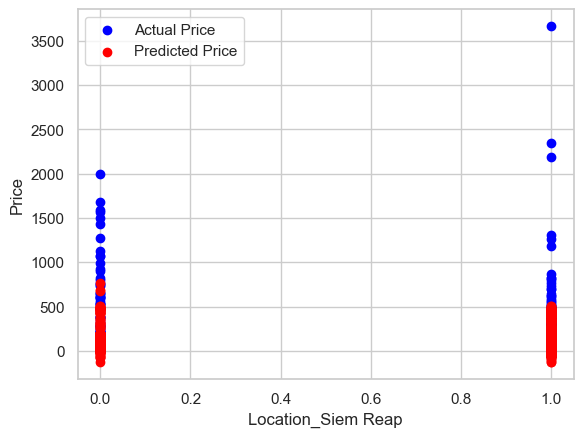

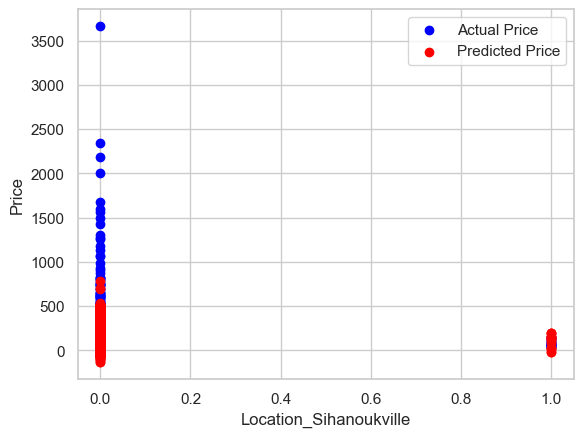

In [126]:
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score

# Create Lasso regression model
lasso = Lasso(alpha=1.0)

# Fit the model on the training data
lasso.fit(X_train, y_train)

# Get the feature names
feature_names = X_train.columns

# Plot the graph for each feature
for feature in feature_names:
    # Create a copy of the test data with the current feature set to a constant value
    X_test_modified = X_test.copy()
    X_test_modified[feature] = X_test[feature].mean()  # Set the feature to the mean value

    # Predict the Price for the modified test data
    y_pred = lasso.predict(X_test_modified)

    # Create a DataFrame for plotting
    results = pd.DataFrame({feature: X_test[feature], 'Actual Price': y_test, 'Predicted Price': y_pred})

    # Sort the DataFrame by the feature for better visualization
    results = results.sort_values(feature)

    # Plot the graph
    plt.scatter(results[feature], results['Actual Price'], color='blue', label='Actual Price')
    plt.scatter(results[feature], results['Predicted Price'], color='red', label='Predicted Price')
    plt.xlabel(feature)
    plt.ylabel('Price')
    plt.legend()
    plt.show()

#### <font color = green|><b>e.) Linear Support Vector Regression

In [127]:
from sklearn.svm import LinearSVR
from sklearn.metrics import mean_squared_error, r2_score

X = df_onehot.drop(["Price", "Tour_Name"], axis=1)
y = df_onehot['Price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

def print_score(regressors, X_train, y_train, X_test, y_test):
    for i, regressor in enumerate(regressors):
        if i == 0:
            print("Train Result:\n================================================")
        else:
            print("\nTest Result:\n================================================")
        
        regressor.fit(X_train, y_train)
        
        y_train_pred = regressor.predict(X_train)
        mse_train = mean_squared_error(y_train, y_train_pred)
        r2_train = r2_score(y_train, y_train_pred)
        
        print(f"Model {i+1}:")
        print(f"Mean Squared Error (Train): {mse_train:.2f}")
        print(f"R-squared (Train): {r2_train:.2f}")
        
        y_test_pred = regressor.predict(X_test)
        mse_test = mean_squared_error(y_test, y_test_pred)
        r2_test = r2_score(y_test, y_test_pred)
        
        print(f"Mean Squared Error (Test): {mse_test:.2f}")
        print(f"R-squared (Test): {r2_test:.2f}")
        print("_______________________________________________")

# Create Linear Support Vector Regression models with different parameters
C_values = [0.1, 0.5, 1.0]
epsilon_values = [0.1, 0.2, 0.5]
regressors = [LinearSVR(C=C, epsilon=epsilon) for C in C_values for epsilon in epsilon_values]

# `SVC(C=1.0, kernel='rbf', degree=3, gamma='scale', coef0=0.0, shrinking=True, probability=False, tol=0.001, cache_size=200, class_weight=None, 
#      verbose=False, max_iter=-1, decision_function_shape='ovr', break_ties=False, random_state=None)

# Evaluate and print the scores for all models
print_score(regressors, X_train, y_train, X_test, y_test)

Train Result:
Model 1:
Mean Squared Error (Train): 38672.45
R-squared (Train): 0.37
Mean Squared Error (Test): 28472.48
R-squared (Test): 0.35
_______________________________________________

Test Result:
Model 2:
Mean Squared Error (Train): 38696.93
R-squared (Train): 0.37
Mean Squared Error (Test): 28533.39
R-squared (Test): 0.34
_______________________________________________

Test Result:


c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



Model 3:
Mean Squared Error (Train): 38692.68
R-squared (Train): 0.37
Mean Squared Error (Test): 28506.95
R-squared (Test): 0.34
_______________________________________________

Test Result:
Model 4:
Mean Squared Error (Train): 37464.39
R-squared (Train): 0.39
Mean Squared Error (Test): 27578.51
R-squared (Test): 0.37
_______________________________________________

Test Result:


c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



Model 5:
Mean Squared Error (Train): 37523.26
R-squared (Train): 0.39
Mean Squared Error (Test): 27654.37
R-squared (Test): 0.36
_______________________________________________

Test Result:
Model 6:
Mean Squared Error (Train): 37558.15
R-squared (Train): 0.39
Mean Squared Error (Test): 27632.76
R-squared (Test): 0.36
_______________________________________________

Test Result:


c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



Model 7:
Mean Squared Error (Train): 37225.25
R-squared (Train): 0.40
Mean Squared Error (Test): 27525.75
R-squared (Test): 0.37
_______________________________________________

Test Result:
Model 8:
Mean Squared Error (Train): 37178.03
R-squared (Train): 0.40
Mean Squared Error (Test): 27445.77
R-squared (Test): 0.37
_______________________________________________

Test Result:
Model 9:
Mean Squared Error (Train): 37194.77
R-squared (Train): 0.40
Mean Squared Error (Test): 27472.95
R-squared (Test): 0.37
_______________________________________________


c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



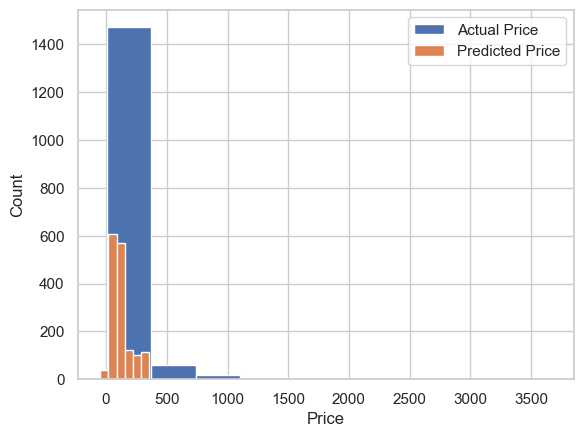

In [128]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import LinearSVR

# Create LinearSVR model
regressor = LinearSVR(C=1)

# SVC(C=1.0, kernel='rbf', degree=3, gamma='scale', coef0=0.0, shrinking=True, probability=False, tol=0.001, cache_size=200, 
#     class_weight=None, verbose=False, max_iter=-1, decision_function_shape='ovr', break_ties=False, random_state=None)


# Fit the model on the training data
regressor.fit(X_train, y_train)

# Predict the Price for the test data
y_pred = regressor.predict(X_test)

# Create a DataFrame for plotting
results = pd.DataFrame({'Actual Price': y_test, 'Predicted Price': y_pred})

# Plot the Actual Price and Predicted Price
plt.hist(results['Actual Price'], label='Actual Price', alpha=1)
plt.hist(results['Predicted Price'], label='Predicted Price', alpha=1)
plt.xlabel('Price')
plt.ylabel('Count')
plt.legend()
plt.show()

c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



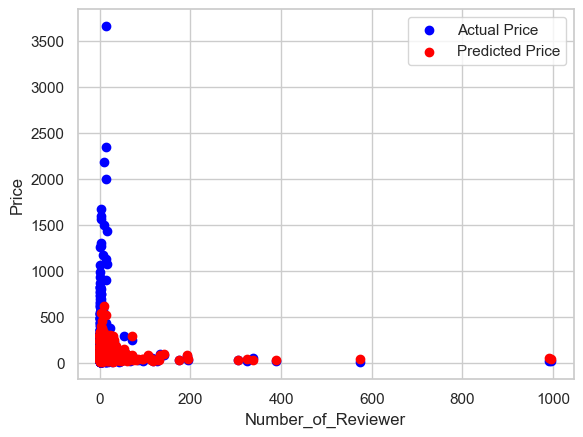

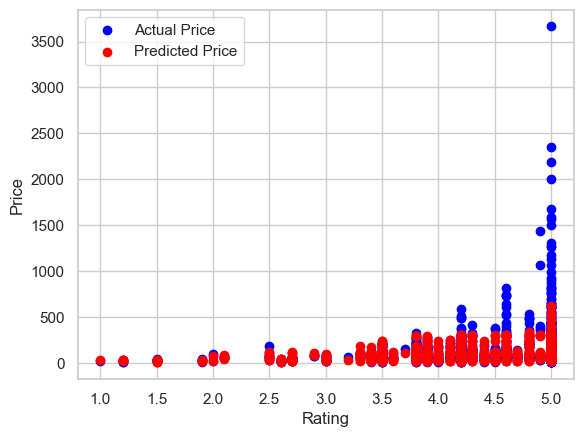

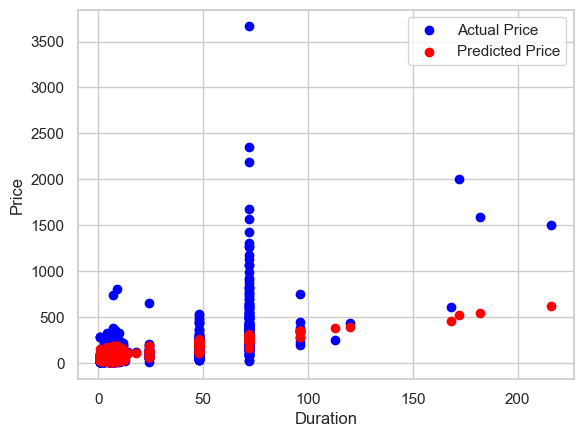

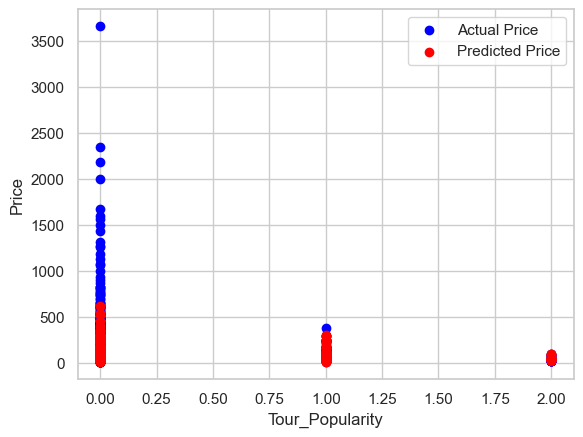

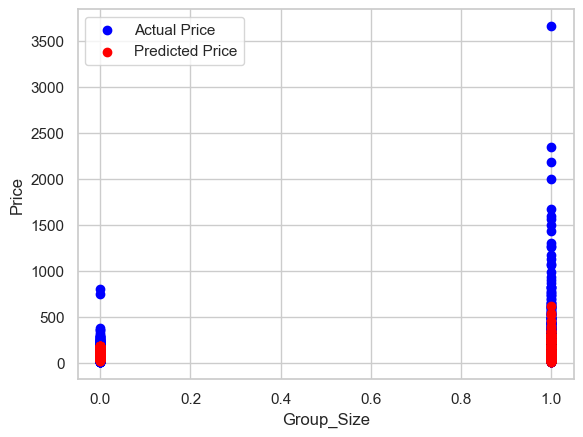

...

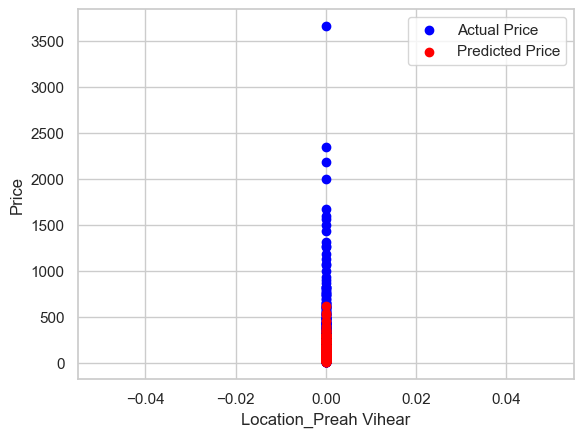

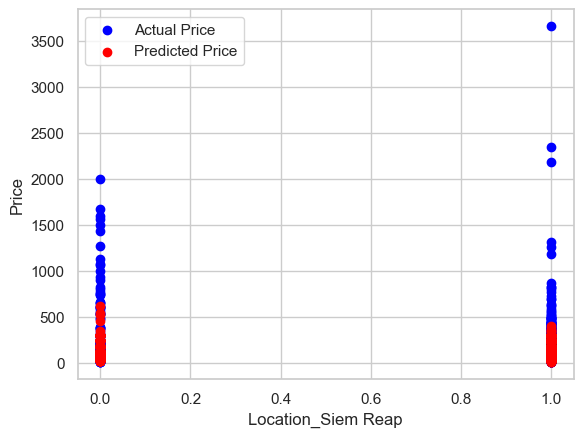

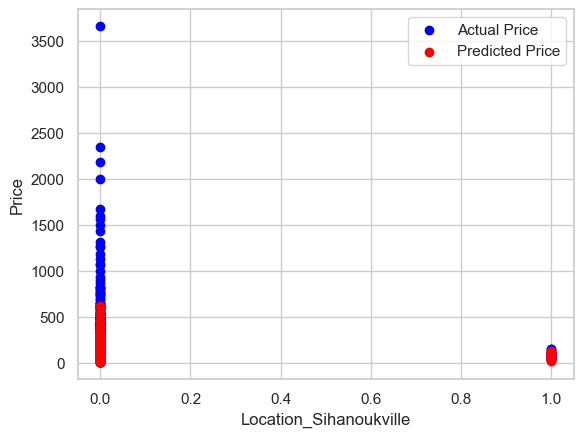

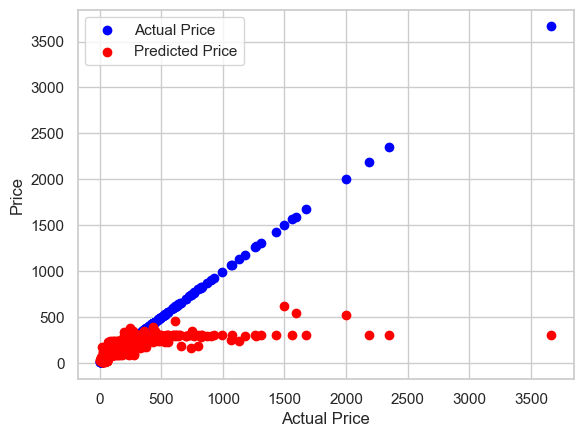

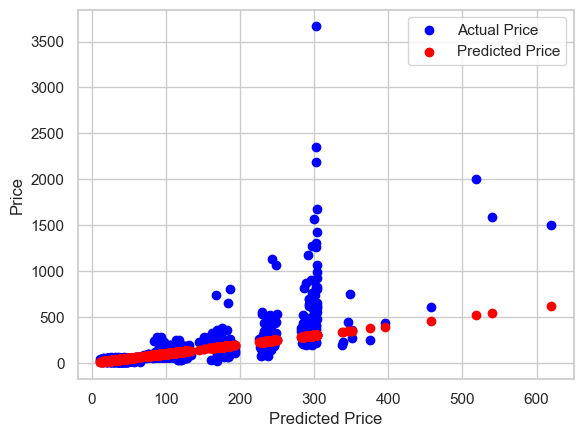

In [129]:
from sklearn.svm import LinearSVR

# Create LinearSVR model
regressor = LinearSVR()

# Fit the model on the training data
regressor.fit(X_train, y_train)

# Predict the Price for the test data
y_pred = regressor.predict(X_test)

# Create a DataFrame for plotting
results = pd.DataFrame(X_test, columns=X_test.columns)
results['Actual Price'] = y_test
results['Predicted Price'] = y_pred

# Plot Predicted Price vs Actual Price for each feature
for feature in X_test.columns:
    plt.scatter(results[feature], results['Actual Price'], color='blue', label='Actual Price')
    plt.scatter(results[feature], results['Predicted Price'], color='red', label='Predicted Price')
    plt.xlabel(feature)
    plt.ylabel('Price')
    plt.legend()
    plt.show()

#### <font color = green|><b>f.) Decision Tree model 

In [130]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score

X = df_onehot.drop(["Price", "Tour_Name"], axis=1)
y = df_onehot['Price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

def print_score(regressor, X_train, y_train, X_test, y_test):
    regressor.fit(X_train, y_train)
    
    y_train_pred = regressor.predict(X_train)
    mse_train = mean_squared_error(y_train, y_train_pred)
    r2_train = r2_score(y_train, y_train_pred)
    
    print("Train Result:\n================================================")
    print(f"Mean Squared Error (Train): {mse_train:.2f}")
    print(f"R-squared (Train): {r2_train:.2f}")
    print("_______________________________________________")
    
    y_test_pred = regressor.predict(X_test)
    mse_test = mean_squared_error(y_test, y_test_pred)
    r2_test = r2_score(y_test, y_test_pred)
    
    print("Test Result:\n================================================")
    print(f"Mean Squared Error (Test): {mse_test:.2f}")
    print(f"R-squared (Test): {r2_test:.2f}")
    print("_______________________________________________")

# Create Decision Tree Regression model
regressor = DecisionTreeRegressor()

# Evaluate and print the scores for the model
print_score(regressor, X_train, y_train, X_test, y_test)

Train Result:
Mean Squared Error (Train): 2042.65
R-squared (Train): 0.97
_______________________________________________
Test Result:
Mean Squared Error (Test): 30745.65
R-squared (Test): 0.29
_______________________________________________


In [131]:
import pandas as pd
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score

def print_score(regressor, X_train, y_train, X_test, y_test):
    regressor.fit(X_train, y_train)
    
    y_train_pred = regressor.predict(X_train)
    mse_train = mean_squared_error(y_train, y_train_pred)
    r2_train = r2_score(y_train, y_train_pred)
    
    y_test_pred = regressor.predict(X_test)
    mse_test = mean_squared_error(y_test, y_test_pred)
    r2_test = r2_score(y_test, y_test_pred)
    
    summary_table = pd.DataFrame({
        'Dataset': ['Train', 'Test'],
        'Mean Squared Error': [mse_train, mse_test],
        'R-squared': [r2_train, r2_test]
    })
    
    print("Regression Summary Table:\n")
    print(summary_table)
    
    if isinstance(regressor, DecisionTreeRegressor):
        feature_importances = regressor.feature_importances_
        feature_names = X_train.columns
        
        feature_importances_table = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
        
        print("\nFeature Importances Table:")
        print(feature_importances_table)


In [132]:
# Create Decision Tree Regression model
regressor = DecisionTreeRegressor()

# Evaluate and print the scores for the model
print_score(regressor, X_train, y_train, X_test, y_test)

Regression Summary Table:

  Dataset  Mean Squared Error  R-squared
0   Train         2042.652727   0.966928
1    Test        27341.093160   0.371048

Feature Importances Table:
                        Feature    Importance
0            Number_of_Reviewer  1.945529e-01
1                        Rating  2.348776e-02
2                      Duration  1.878316e-01
3               Tour_Popularity  5.593441e-05
4                    Group_Size  3.536229e-03
5        Transportation_Quality  3.895029e-01
6                          Food  2.004214e-02
7                  Tour_Quality  1.300023e-05
8     Tour_Type_Adventure Tours  1.261809e-02
9          Tour_Type_Bike Tours  4.599900e-05
10          Tour_Type_Bus Tours  7.194294e-02
11         Tour_Type_City Tours  1.696910e-02
12       Tour_Type_Cruise Tours  2.978206e-03
13     Tour_Type_Cultural Tours  1.728744e-02
14         Tour_Type_Food Tours  1.947605e-02
15       Tour_Type_Health Tours  1.030853e-05
16  Tour_Type_Photography Tours  0.00000

In [133]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_graphviz
import graphviz

# Assuming you have trained a DecisionTreeRegressor model called "regressor"

# Export the decision tree as a DOT file
dot_data = export_graphviz(regressor, out_file=None, feature_names=X_test.columns)

# Create a graph from the DOT data
graph = graphviz.Source(dot_data)

# Display the graph
graph.render('decision_tree')  # Save the graph as a PDF or any other format
graph.view()  # Open the graph in the default viewer


'decision_tree.pdf'

#### <font color = green|><b>g.) Ridge Regression model 

In [141]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score

X = df_onehot.drop(["Price", "Tour_Name"], axis=1)
y = df_onehot['Price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

def print_score(regressor, X_train, y_train, X_test, y_test):
    regressor.fit(X_train, y_train)
    
    y_train_pred = regressor.predict(X_train)
    mse_train = mean_squared_error(y_train, y_train_pred)
    r2_train = r2_score(y_train, y_train_pred)
    
    print("Train Result:\n================================================")
    print(f"Mean Squared Error (Train): {mse_train:.2f}")
    print(f"R-squared (Train): {r2_train:.2f}")
    print("_______________________________________________")
    
    y_test_pred = regressor.predict(X_test)
    mse_test = mean_squared_error(y_test, y_test_pred)
    r2_test = r2_score(y_test, y_test_pred)
    
    print("Test Result:\n================================================")
    print(f"Mean Squared Error (Test): {mse_test:.2f}")
    print(f"R-squared (Test): {r2_test:.2f}")
    print("_______________________________________________")

# Create Ridge Regression model
regressor = Ridge()

# Evaluate and print the scores for the model
print_score(regressor, X_train, y_train, X_test, y_test)

Train Result:
Mean Squared Error (Train): 30822.12
R-squared (Train): 0.50
_______________________________________________
Test Result:
Mean Squared Error (Test): 23615.51
R-squared (Test): 0.46
_______________________________________________


In [150]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score

def print_score(regressor, X_train, y_train, X_test):
    regressor.fit(X_train, y_train)
    
    y_train_pred = regressor.predict(X_train)
    mse_train = mean_squared_error(y_train, y_train_pred)
    r2_train = r2_score(y_train, y_train_pred)
    
    y_test_pred = regressor.predict(X_test)  
    return y_test_pred

# Create Ridge Regression model
regressor = Ridge(alpha=1.0, fit_intercept=True, normalize=False, solver='auto', random_state=None)

# Make predictions on the test set
y_test_pred = print_score(regressor, X_train, y_train, X_test)

df1 = pd.DataFrame({'y_train':y_train,'y_train_predict':y_train_pred})
print(df1)
print('======================================')
df2 = pd.DataFrame({'y_test':y_test,'y_test_predict':y_test_pred})
print(df2)

      y_train  y_train_predict
2997   243.92       233.131063
2131    95.00       188.831188
1730    60.00        72.388765
1369    26.90       -15.360416
557    102.57       129.236115
...       ...              ...
3094    52.73         3.315651
1096    34.00        42.701456
1131   246.16       397.877303
1295    20.00        56.357105
861    144.00       314.079613

[1563 rows x 2 columns]
      y_test  y_test_predict
1189  102.57      161.024298
1135   97.44       93.290753
2160  320.00      419.461068
1468   76.93      175.041603
1073  134.62      208.159016
...      ...             ...
1568  255.00      217.090532
132    18.47     -176.801196
2011  133.34      145.137241
2930   60.00      171.193617
421    22.00      106.077135

[1563 rows x 2 columns]


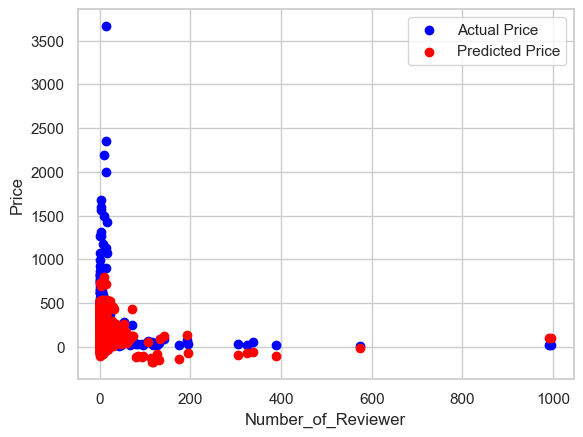

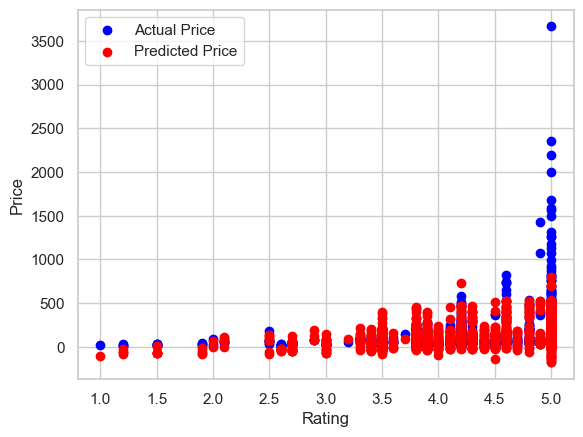

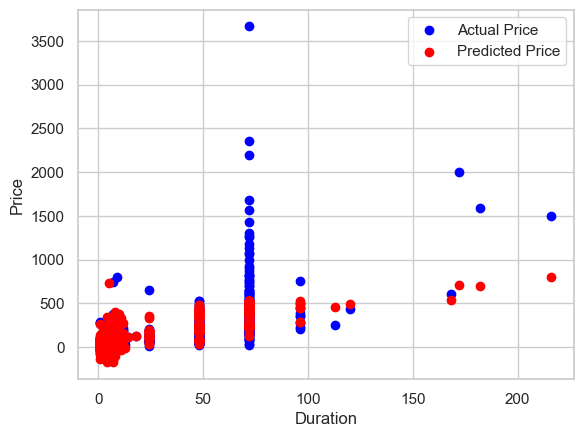

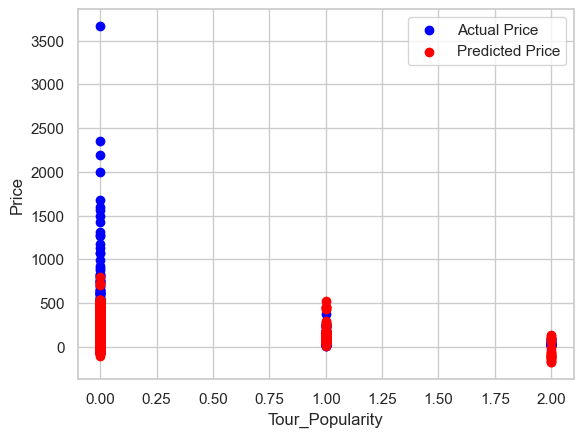

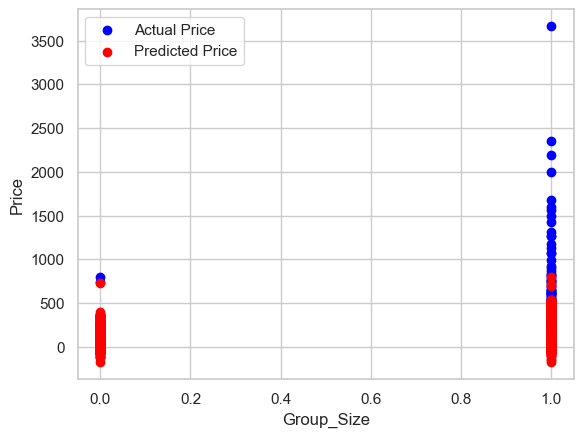

...

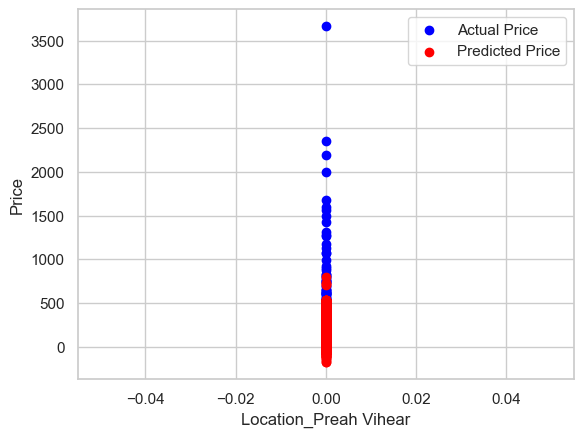

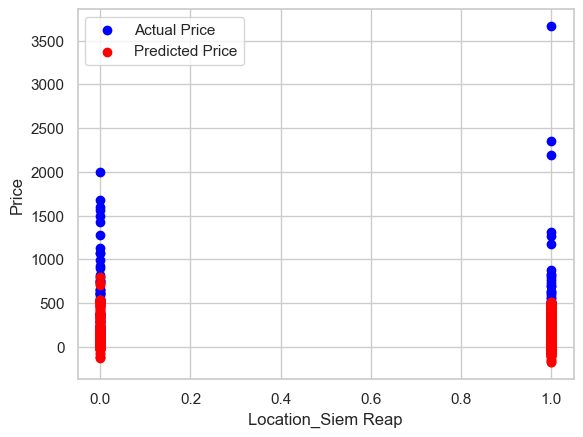

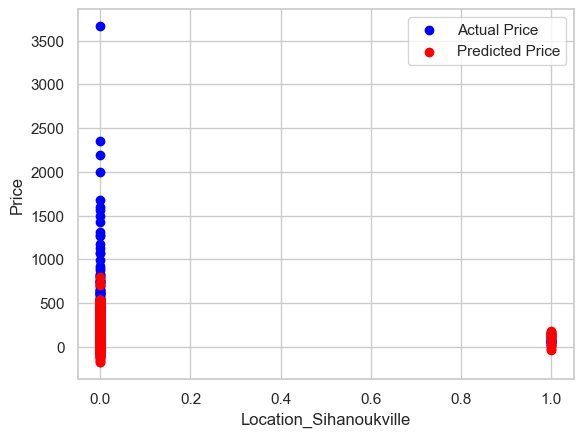

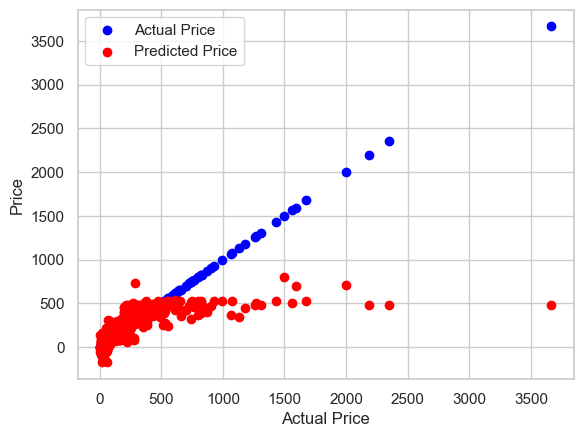

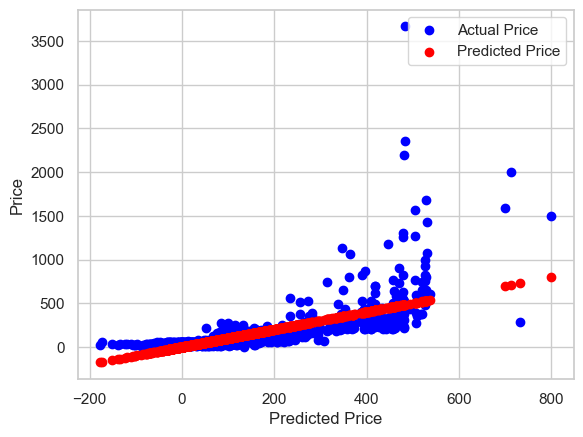

In [151]:
# Create LinearSVR model
regressor = Ridge()

# Fit the model on the training data
regressor.fit(X_train, y_train)

# Predict the Price for the test data
y_pred = regressor.predict(X_test)

# Create a DataFrame for plotting
results = pd.DataFrame(X_test, columns=X_test.columns)
results['Actual Price'] = y_test
results['Predicted Price'] = y_pred

# Plot Predicted Price vs Actual Price for each feature
for feature in X_test.columns:
    plt.scatter(results[feature], results['Actual Price'], color='blue', label='Actual Price')
    plt.scatter(results[feature], results['Predicted Price'], color='red', label='Predicted Price')
    plt.xlabel(feature)
    plt.ylabel('Price')
    plt.legend()
    plt.show()


#### <font color = green|><b>h.) Gradient Boosting Regression

In [160]:
from sklearn.metrics import mean_squared_error, r2_score

X = df_onehot.drop(["Price", "Tour_Name"], axis=1)
y = df_onehot['Price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

def print_regression_score(model, X_train, y_train, X_test, y_test):
    # Predict on training and testing data
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Calculate metrics for training set
    train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
    train_r2 = r2_score(y_train, y_train_pred)
    
    # Calculate metrics for testing set
    test_rmse = mean_squared_error(y_test, y_test_pred, squared=False)
    test_r2 = r2_score(y_test, y_test_pred)
    
    # Print the results
    print("Train Result:\n================================================")
    print(f"RMSE: {train_rmse:.2f}")
    print(f"R^2 Score: {train_r2:.2f}")
    print("_______________________________________________\n")
    
    print("Test Result:\n================================================")
    print(f"RMSE: {test_rmse:.2f}")
    print(f"R^2 Score: {test_r2:.2f}")
    print("_______________________________________________\n")
    
from sklearn.ensemble import GradientBoostingRegressor

# Create the Gradient Boosting model
regressor = GradientBoostingRegressor(loss='ls', learning_rate=0.1, n_estimators=100, subsample=1.0, criterion='friedman_mse', min_samples_split=2, 
                                      min_samples_leaf=1, max_depth=3, max_features=None, random_state=None)


# Fit the model to the training data
regressor.fit(X_train, y_train)

# Evaluate the model
print_regression_score(gb_reg, X_train, y_train, X_test, y_test)

Train Result:
RMSE: 92.91
R^2 Score: 0.86
_______________________________________________

Test Result:
RMSE: 124.39
R^2 Score: 0.64
_______________________________________________



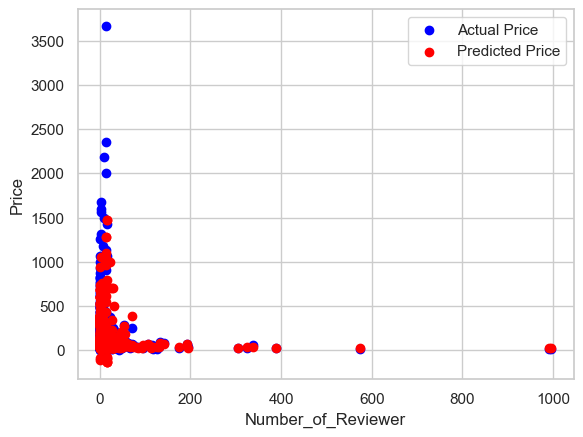

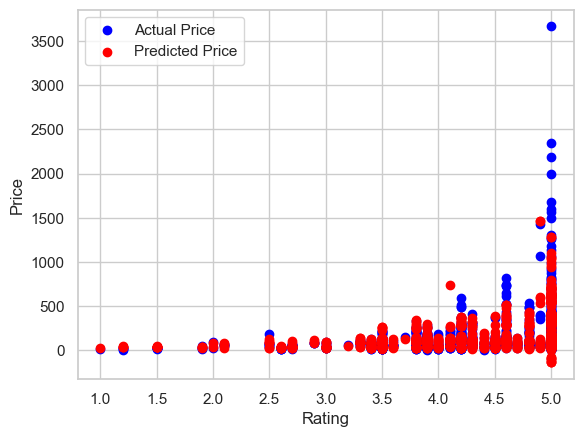

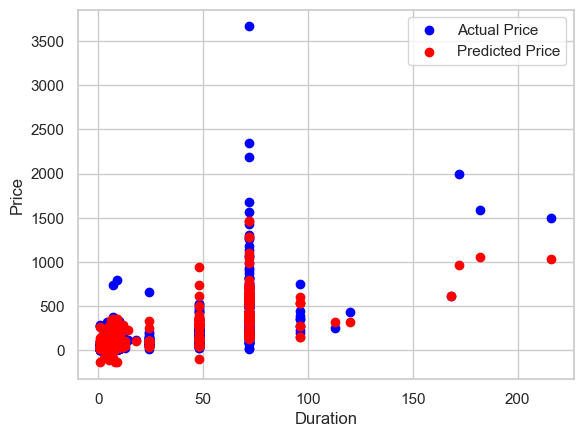

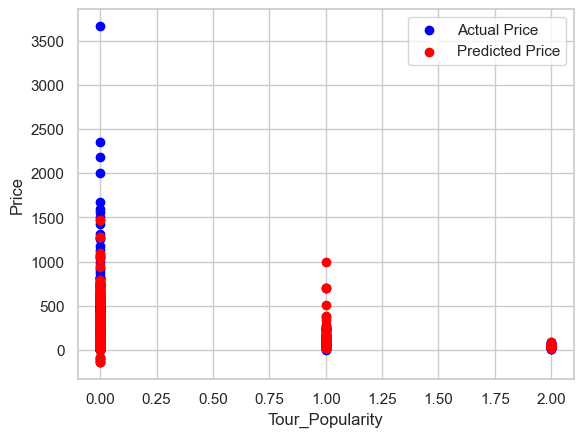

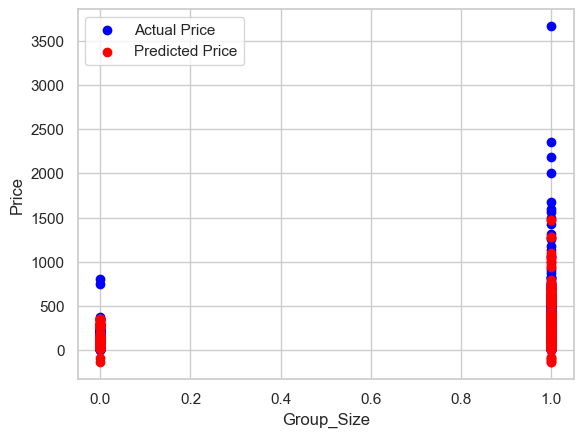

...

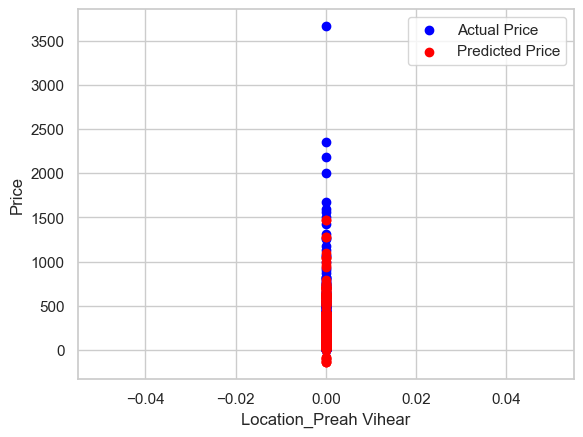

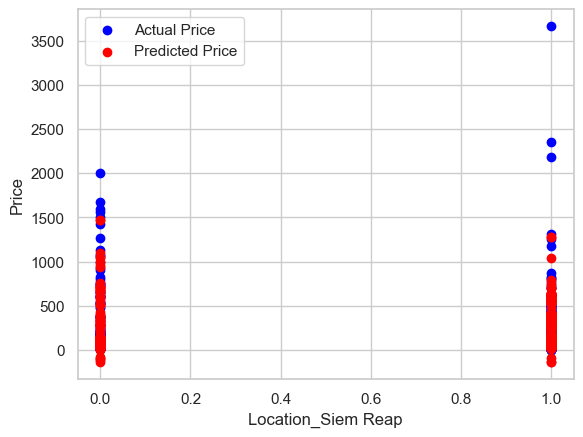

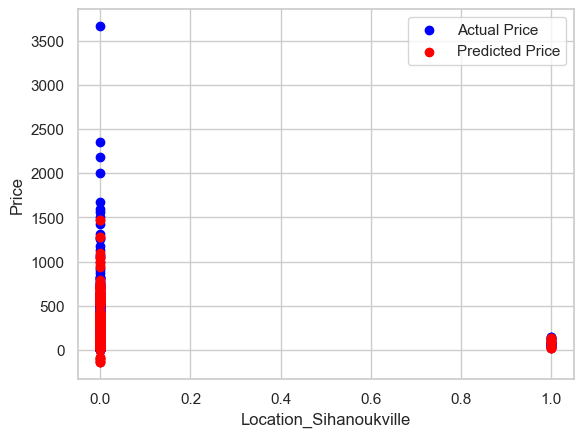

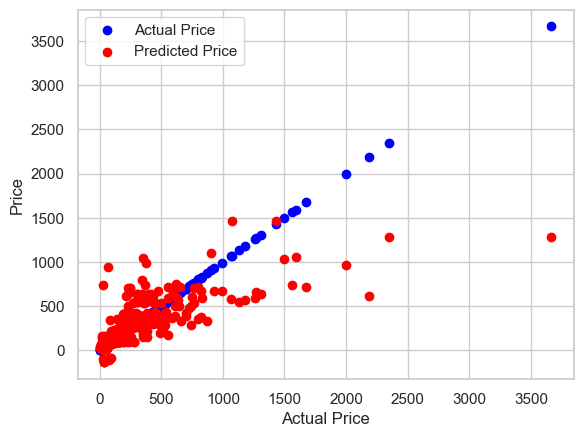

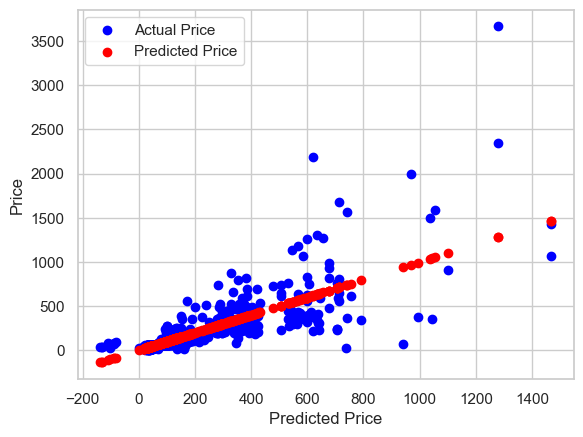

In [161]:
# Predict the Price for the test data
y_pred = regressor.predict(X_test)

# Create a DataFrame for plotting
results = pd.DataFrame(X_test, columns=X_test.columns)
results['Actual Price'] = y_test
results['Predicted Price'] = y_pred

# Plot Predicted Price vs Actual Price for each feature
for feature in X_test.columns:
    plt.scatter(results[feature], results['Actual Price'], color='blue', label='Actual Price')
    plt.scatter(results[feature], results['Predicted Price'], color='red', label='Predicted Price')
    plt.xlabel(feature)
    plt.ylabel('Price')
    plt.legend()
    plt.show()

#### <font color = green|><b>i.) Random Forest</font>

Train MSE: 4530.11070716771
Train R2 Score: 0.9266534994541175
Test MSE: 17495.374881245512
Test R2 Score: 0.5975382179338393


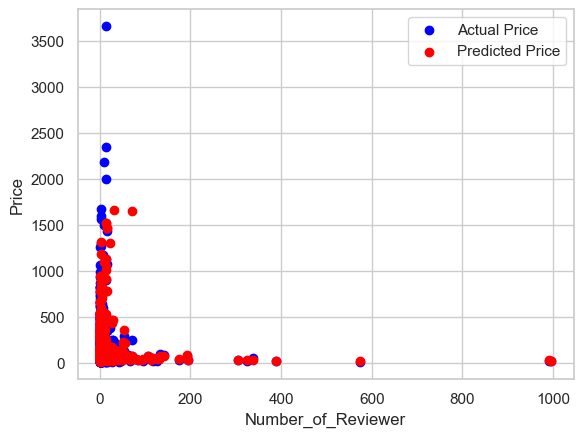

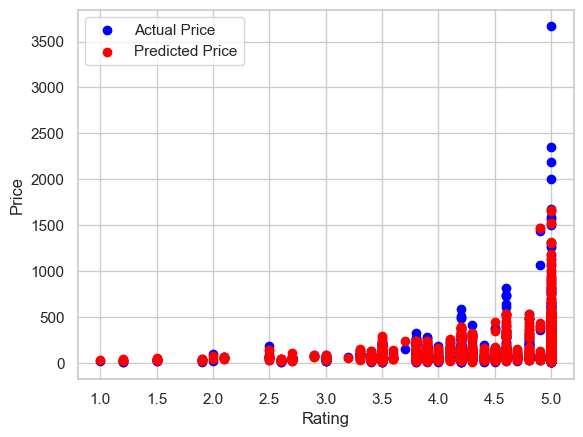

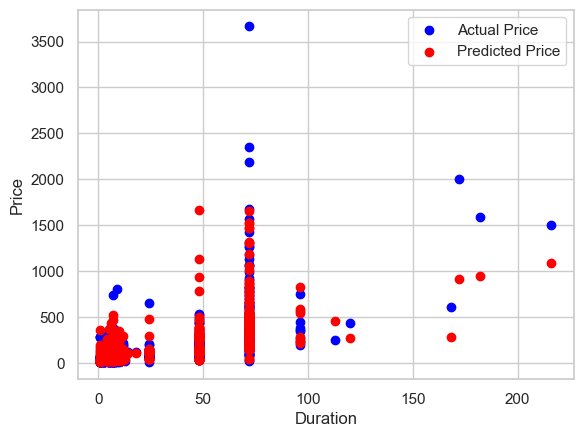

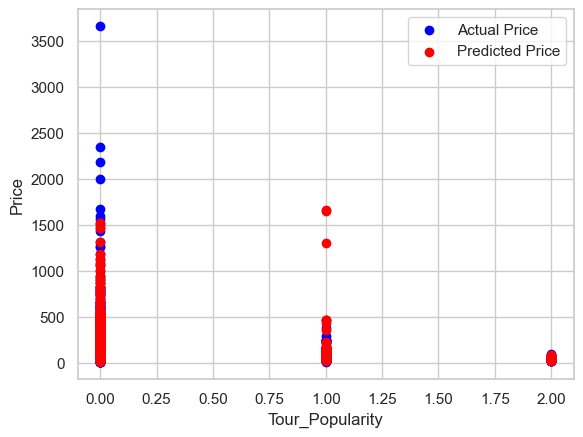

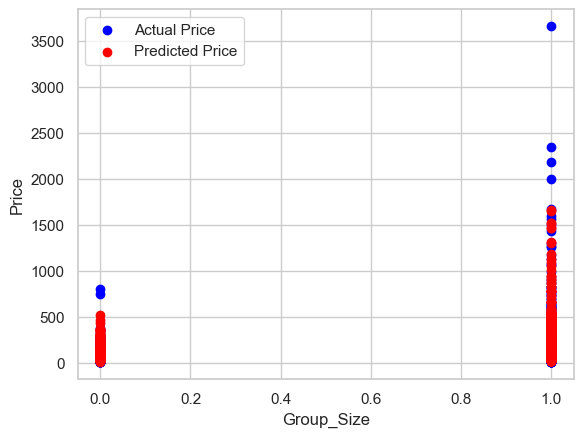

...

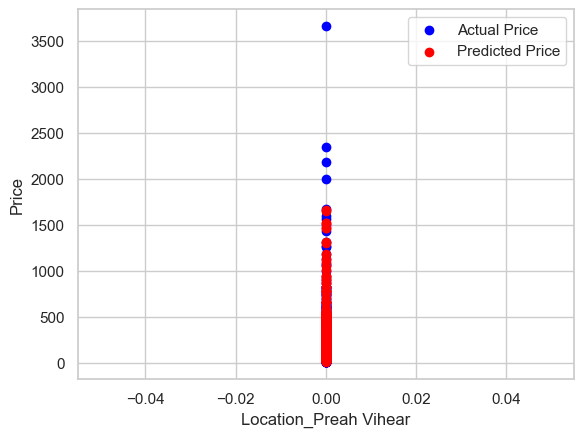

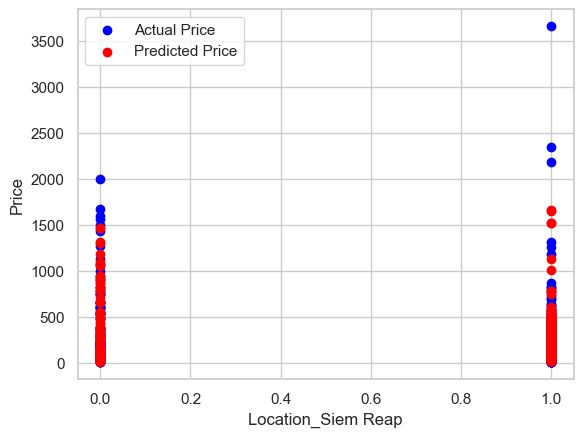

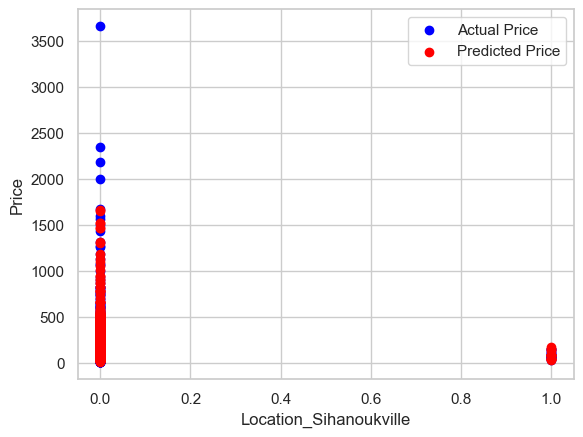

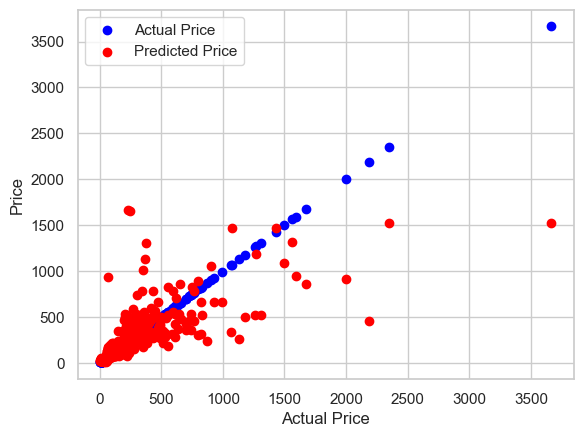

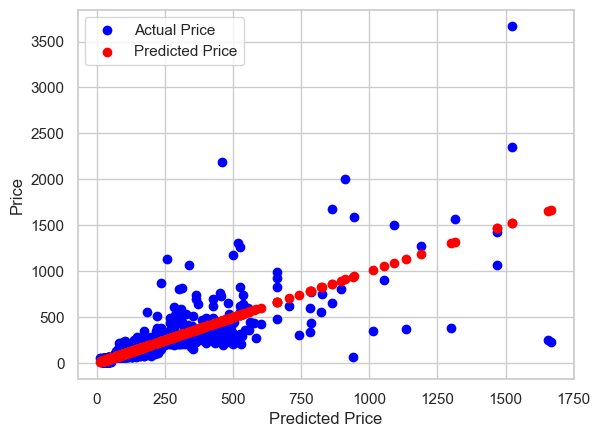

In [168]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

X = df_onehot.drop(["Price", "Tour_Name"], axis=1)
y = df_onehot['Price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

# Create Random Forest Regressor model
regressor = RandomForestRegressor(n_estimators=100, criterion='mse', max_depth=None, min_samples_split=2, min_samples_leaf=1, max_features='auto', bootstrap=True, random_state=None)

# Fit the model on the training data
regressor.fit(X_train, y_train)

# Make predictions on the test set
y_test_pred = regressor.predict(X_test)

# Evaluate the model
y_train_pred = regressor.predict(X_train)
mse_train = mean_squared_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print('Train MSE:', mse_train)
print('Train R2 Score:', r2_train)
print('Test MSE:', mse_test)
print('Test R2 Score:', r2_test)

# Create a DataFrame for plotting
results = pd.DataFrame(X_test, columns=X_test.columns)
results['Actual Price'] = y_test
results['Predicted Price'] = y_pred

# Plot Predicted Price vs Actual Price for each feature
for feature in X_test.columns:
    plt.scatter(results[feature], results['Actual Price'], color='blue', label='Actual Price')
    plt.scatter(results[feature], results['Predicted Price'], color='red', label='Predicted Price')
    plt.xlabel(feature)
    plt.ylabel('Price')
    plt.legend()
    plt.show()

#### <font color = green|><b>j.) Elastic Net Regression

c:\Users\LH\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.



Train MSE: 34742.863993868734
Train R2 Score: 0.4374822917992156
Test MSE: 25388.0430962598
Test R2 Score: 0.4159761001379698


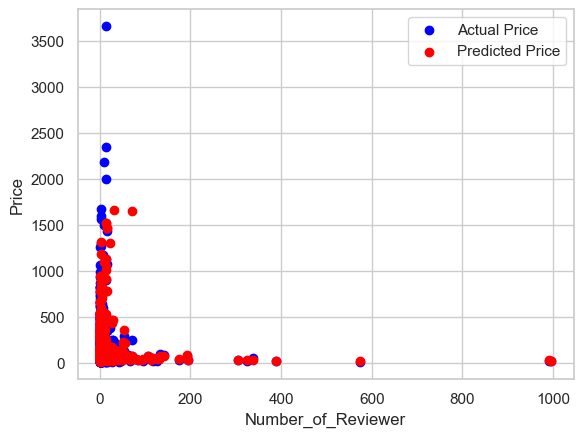

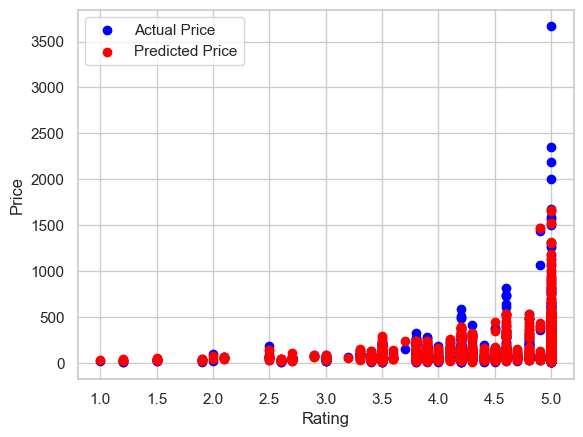

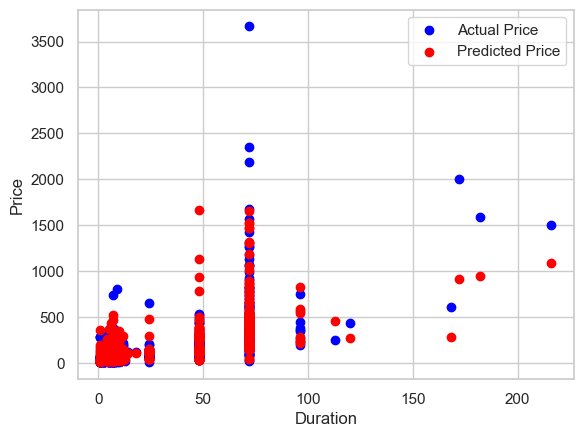

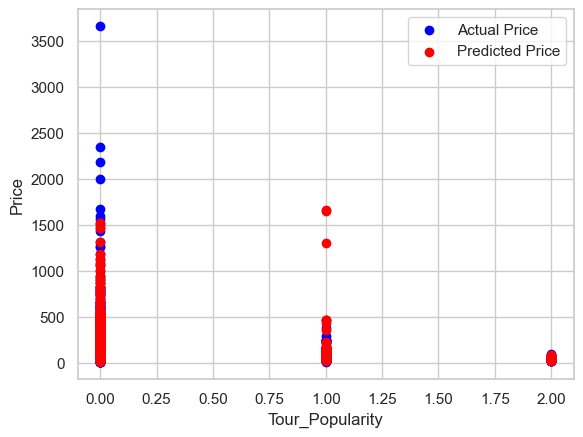

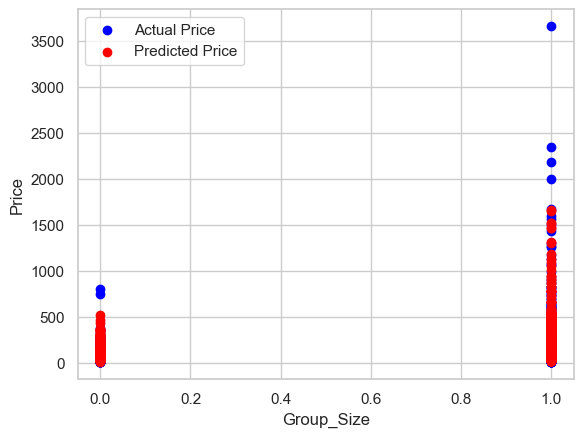

...

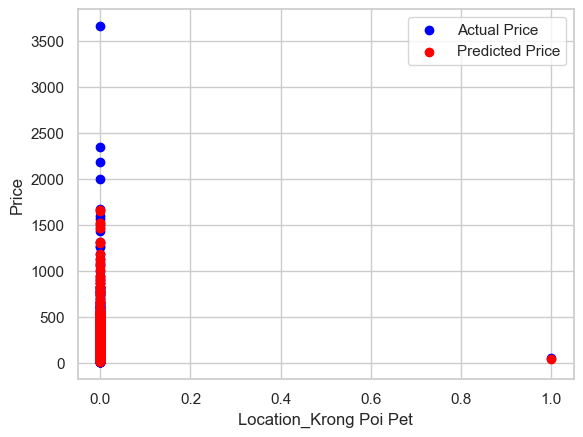

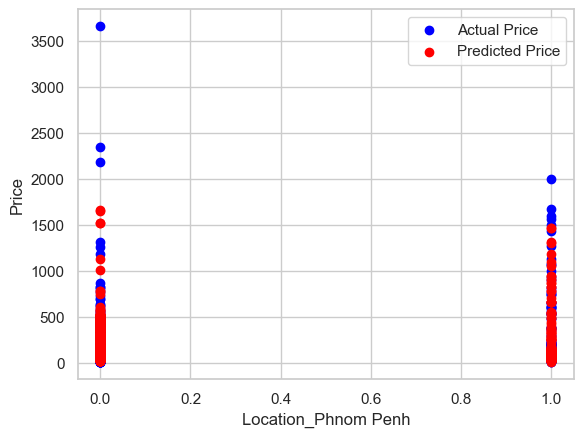

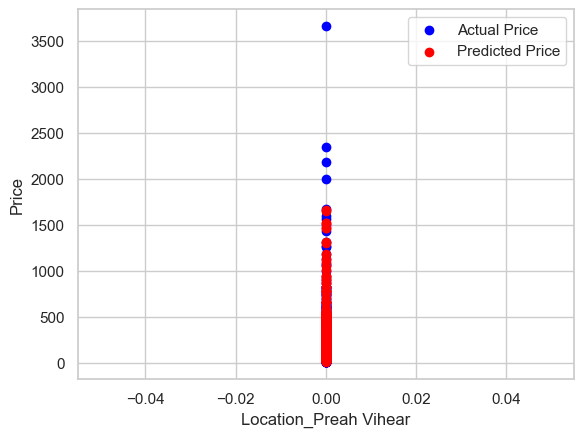

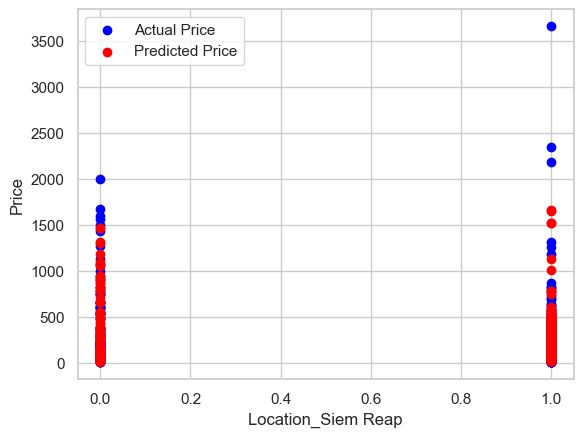

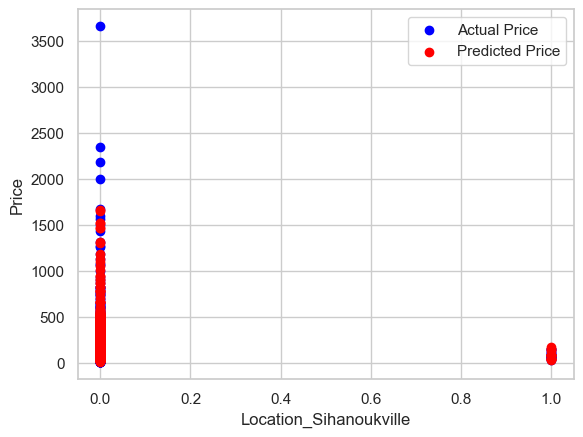

In [171]:
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error, r2_score

X = df_onehot.drop(["Price", "Tour_Name"], axis=1)
y = df_onehot['Price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

# Create Elastic Net Regression model
regressor = ElasticNet(alpha=1.0, l1_ratio=0.5, fit_intercept=True, normalize=False, max_iter=1000, tol=0.0001, random_state=None, selection='cyclic')

# Fit the model on the training data
regressor.fit(X_train, y_train)

# Make predictions on the test set
y_test_pred = regressor.predict(X_test)

# Evaluate the model
y_train_pred = regressor.predict(X_train)
mse_train = mean_squared_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print('Train MSE:', mse_train)
print('Train R2 Score:', r2_train)
print('Test MSE:', mse_test)
print('Test R2 Score:', r2_test)

# Plot Predicted Price vs Actual Price for each feature
for feature in X_test.columns:
    plt.scatter(results[feature], results['Actual Price'], color='blue', label='Actual Price')
    plt.scatter(results[feature], results['Predicted Price'], color='red', label='Predicted Price')
    plt.xlabel(feature)
    plt.ylabel('Price')
    plt.legend()
    plt.show()